<font color="#CA3532"><h1 align="left">**Neural Skin Cancer Detector: Clasificador de Nevus**</h1></font>
<font color="#6E6E6E"><h2 align="left">**Silvia Prieto y Celia Fernández**</h2></font>

Este archivo está preparado para ser utilizado en colab. Es importante poner atención a las rutas para que la ejecución se pueda llevar a cabo sin errores.

# Código común de los modelos

## Carga de las librerías

In [ ]:
!pip install mlflow
!pip install shap
!pip install --upgrade ctgan
!pip install table_evaluator

In [ ]:
!which python

/usr/local/bin/python


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from PIL import Image
import matplotlib.image as mpimg
import cv2
from keras.metrics import Accuracy
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from keras.optimizers import Adam
import zipfile
import mlflow
import mlflow.keras
from sklearn.utils import shuffle
from keras.models import Sequential, load_model, Model
from keras.layers import (Dense, Dropout, Input, Concatenate, Flatten, Conv2D, MaxPooling2D, Activation,
                          BatchNormalization)
from keras import backend as K
from keras import regularizers
from keras import optimizers
from keras.callbacks import ModelCheckpoint

from IPython.display import SVG, clear_output
from keras.utils import model_to_dot

#from keras.preprocessing.image import ImageDataGenerator
from keras.utils import load_img, img_to_array
from sklearn.metrics import classification_report, roc_curve, auc

import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
from glob import glob

from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import random
import keras
from datetime import datetime
import tensorflow as tf


In [ ]:
from keras.applications import ResNet50
from keras.layers import GlobalAveragePooling2D, Dense
from keras import Model

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import preprocess_input

In [ ]:
seed = 0

# Establecer la semilla para Python
random.seed(seed)
# Establecer la semilla para NumPy
np.random.seed(seed)
# establecer semilla para keras
keras.utils.set_random_seed(seed)
tf.random.set_seed(seed)


## Funciones auxiliares

In [ ]:
def extraer_archivos_especificos(zip_path, archivos_a_extraer, carpeta_destino):
    """
    Extrae solo los archivos especificados desde un archivo ZIP.
    """
    # Crear el directorio de destino si no existe
    os.makedirs(carpeta_destino, exist_ok=True)

    with zipfile.ZipFile(zip_path, 'r') as zip_file:
        # Obtener los nombres de todos los archivos en el ZIP
        todos_los_archivos = zip_file.namelist()

        # Iterar sobre los archivos que queremos extraer
        for archivo in archivos_a_extraer:
            if archivo in todos_los_archivos:
                zip_file.extract(archivo, carpeta_destino)
                print(f'Archivo extraído: {archivo}')
            else:
                print(f'Archivo no encontrado en el ZIP: {archivo}')

In [ ]:
# Función para obtener las muestras
def obtener_muestras(df, num_muestras):
    # Seleccionar todas las muestras con target = 1
    muestras_target_1 = df[df['target'] == 'maligno']

    # Contar cuántas muestras ya tenemos
    cantidad_target_1 = muestras_target_1.shape[0]

    # Si ya tenemos suficientes muestras con target = 1
    if cantidad_target_1 >= num_muestras:
        return muestras_target_1.sample(n=num_muestras)

    # Si no, completar con muestras aleatorias que no sean target = 1
    muestras_faltantes = num_muestras - cantidad_target_1
    muestras_no_target_1 = df[df['target'] != 'maligno']

    # Seleccionar muestras adicionales aleatorias de target != 1
    muestras_adicionales = muestras_no_target_1.sample(n=muestras_faltantes, random_state=0)

    # Combinar ambas selecciones
    muestras_finales = pd.concat([muestras_target_1, muestras_adicionales])

    return muestras_finales

In [ ]:
from IPython.display import SVG
from keras.utils import model_to_dot

def display_model(model):
    if COLAB:
        display(SVG(model_to_dot(model, show_shapes=True,dpi=72).create(prog='dot', format='svg')))
    else:
        display(SVG(model_to_dot(model, show_shapes=True).create(prog='dot', format='svg')))

In [ ]:
from matplotlib.ticker import MaxNLocator
from IPython.display import clear_output

def grafica_entrenamiento(tr_acc, val_acc, tr_loss, val_loss, figsize=(10,4)):
    i_best_acc  = np.argmax(val_acc)
    i_best_loss = np.argmin(val_loss)

    plt.figure(figsize=figsize)

    ax = plt.subplot(1,2,1)
    plt.plot(1+np.arange(len(tr_acc)),  100*np.array(tr_acc), label="entrenamiento")
    plt.plot(1+np.arange(len(val_acc)), 100*np.array(val_acc), label="validación")
    plt.plot(1+i_best_acc, 100*val_acc[i_best_acc], 'or', label="Mejor accuracy")
    plt.title('tasa de acierto del modelo (%)', fontsize=18)
    plt.ylabel('tasa de acierto (%)', fontsize=18)
    plt.xlabel('época', fontsize=18)
    plt.legend(loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    ax = plt.subplot(1,2,2)
    plt.plot(1+np.arange(len(tr_acc)), np.array(tr_loss), label="entrenamiento")
    plt.plot(1+np.arange(len(val_acc)), np.array(val_loss), label="validación")
    plt.plot(1+i_best_loss, val_loss[i_best_loss], 'og', label="Mejor loss")
    plt.title('loss del modelo', fontsize=18)
    plt.ylabel('loss', fontsize=18)
    plt.xlabel('época', fontsize=18)
    plt.legend(loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

In [ ]:
def optimizar_umbral(predictions_prob, true_labels, benigno_min_precision=0.8, umbrales=None):
    """
    Optimiza el umbral de decisión para maximizar la detección de malignos
    mientras se cumple con un mínimo de precisión en benignos.
    Parametros:
    - predictions_prob: Probabilidades de predicción del modelo
    - true_labels: Etiquetas verdaderas (0 benigno, 1 maligno)
    - benigno_min_precision: minimo de benignos a detectar correctamente (0.8 default)
    - umbrales: Lista de umbrales a probar (default:np.arange(0.1, 0.6, 0.05))

    devuelve: mejor umbral que maximiza la deteccion de malignos, matriz confusion y el acierto para benignos y malignos

    """
    if umbrales is None:
        umbrales = np.arange(0.1, 0.6, 0.05)

    mejor_umbral = None
    mejor_maligno_detectado = -1  # Inicializar en -1 para maximizar
    mejor_cm = None  # cm para el mejor umbral encontrado
    mejor_precision_benignos = -1  # almacenar la mejor precisión de benignos

    # Definir clases
    class_labels = ['Benigno', 'Maligno']

    # Recorrer cada umbral
    for umbral in umbrales:
        # Convertir probabilidades en etiquetas usando el umbral
        predictions = (predictions_prob[:, 1] > umbral).astype(int)  # malignos es la 1

        # Calcular matriz de confusión:
        cm = confusion_matrix(true_labels, predictions, labels=[0, 1])

        # Extraer verdaderos negativos y verdaderos positivos
        tn, fp, fn, tp = cm.ravel()

        # Calcular precisión de benignos (verdaderos negativos / total de benignos)
        total_benignos = tn + fp
        precision_benignos = tn / total_benignos if total_benignos > 0 else 0

        # Calcular la tasa de detección de malignos (verdaderos positivos / total de malignos)
        total_malignos = tp + fn
        deteccion_malignos = tp / total_malignos if total_malignos > 0 else 0

        # Comprobar si la precisión de benignos cumple con la condición
        if precision_benignos >= benigno_min_precision:
            # Si cumple, buscamos el umbral que maximice la detección de malignos
            if deteccion_malignos > mejor_maligno_detectado:
                mejor_maligno_detectado = deteccion_malignos
                mejor_umbral = umbral
                mejor_cm = cm
                mejor_precision_benignos = precision_benignos

    # Si no se encontró ningún umbral que cumpla con la precisión de benignos, retornar None
    if mejor_umbral is None:
        print("No se encontró ningún umbral que cumpla con la condición de precisión mínima en benignos.")
        return None

    # Mostrar la mejor matriz de confusión
    disp = ConfusionMatrixDisplay(confusion_matrix=mejor_cm, display_labels=class_labels)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f'Matriz de Confusión con Umbral {mejor_umbral:.2f}')
    plt.show()

    # Imprimir los valores calculados
    print(f"Mejor umbral: {mejor_umbral:.2f}")
    print(f"Precisión de benignos: {mejor_precision_benignos:.2f}")
    print(f"Detección de malignos: {mejor_maligno_detectado:.2f}")

    return mejor_umbral


In [ ]:
def combined_generator(image_generator, other_data, y_data):
    while True:
        # Obtener un batch de imágenes y etiquetas del image_generator
        image_batch, y_batch = next(image_generator)

        # Obtener el batch correspondiente de las otras variables (sin augmentación)
        batch_size = image_batch.shape[0]
        other_batch = other_data[:batch_size]

        # Yield las imágenes augmentadas y las variables adicionales junto con las etiquetas
        yield (image_batch, other_batch), y_batch


In [ ]:
# Función para crear un dataset de TensorFlow a partir del generador
def generator_dataset(image_generator, other_data, y_data, batch_size):
    # Crear el dataset desde el generador personalizado
    dataset = tf.data.Dataset.from_generator(
        lambda: combined_generator(image_generator, other_data, y_data),  # Generador
        output_signature=(
            (tf.TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32),  # Especificación de la imagen
             tf.TensorSpec(shape=(None, X_train_scaled.shape[1]), dtype=tf.float32)),  # Especificación de las variables adicionales
            tf.TensorSpec(shape=(None, 2), dtype=tf.float32)  # Especificación de la salida (etiquetas)
        )
    )
    return dataset

## Conexión con google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Carga de los datos

In [ ]:
# Modificar aquí la ruta a los datos, las imagenes.
base_path = '/content/drive/Shareddrives/MVP_SC/datos/'
modelos_data_path = '/content/drive/Shareddrives/MVP_SC/modelos_data/'
modelos_image_path = '/content/drive/Shareddrives/MVP_SC/modelos/'

images_path = base_path + 'image/'
data_path = base path + 'train-metadata.csv'

## Analisis exploratorio

El analisis exploratorio de los datos sera comun a ambos modelos y se hará sobre todos los datos y luego se seleccionaran aquellas muestras que no tengan nulos en las columnas categoricas para tener muestras lo mas precisas posibles al tener esta disponibilidad de datos

In [ ]:
data = pd.read_csv(data_path)
data.head()

<ipython-input-13-e22b98c88890>:1: DtypeWarning: Columns (51,52) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(data_path)


,isic_id,target,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,image_type,tbp_tile_type,tbp_lv_A,...,lesion_id,iddx_full,iddx_1,iddx_2,iddx_3,iddx_4,iddx_5,mel_mitotic_index,mel_thick_mm,tbp_lv_dnn_lesion_confidence
0,ISIC_0015670,0,IP_1235828,60.0,male,lower extremity,3.04,TBP tile: close-up,3D: white,20.244422,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,97.517282
1,ISIC_0015845,0,IP_8170065,60.0,male,head/neck,1.10,TBP tile: close-up,3D: white,31.712570,...,IL_6727506,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,3.141455
2,ISIC_0015864,0,IP_6724798,60.0,male,posterior torso,3.40,TBP tile: close-up,3D: XP,22.575830,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,99.804040
3,ISIC_0015902,0,IP_4111386,65.0,male,anterior torso,3.22,TBP tile: close-up,3D: XP,14.242329,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,99.989998
4,ISIC_0024200,0,IP_8313778,55.0,male,anterior torso,2.73,TBP tile: close-up,3D: white,24.725520,...,NaN,Benign,Benign,NaN,NaN,NaN,NaN,NaN,NaN,70.442510


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401059 entries, 0 to 401058
Data columns (total 55 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   isic_id                       401059 non-null  object 
 1   target                        401059 non-null  int64  
 2   patient_id                    401059 non-null  object 
 3   age_approx                    398261 non-null  float64
 4   sex                           389542 non-null  object 
 5   anatom_site_general           395303 non-null  object 
 6   clin_size_long_diam_mm        401059 non-null  float64
 7   image_type                    401059 non-null  object 
 8   tbp_tile_type                 401059 non-null  object 
 9   tbp_lv_A                      401059 non-null  float64
 10  tbp_lv_Aext                   401059 non-null  float64
 11  tbp_lv_B                      401059 non-null  float64
 12  tbp_lv_Bext                   401059 non-nul

In [ ]:
duplicated_rows = data.duplicated(keep=False).sum()
duplicated_rows

0

In [ ]:
data['image_type'].value_counts()

,count
image_type,
TBP tile: close-up,401059


In [ ]:
# Reemplazar 0 por 'benigno' y 1 por 'maligno' en el DataFrame
data['target'] = data['target'].map({0: 'benigno', 1: 'maligno'})
data['target'].value_counts()

,count
target,
benigno,400666
maligno,393


In [ ]:
data['tbp_lv_dnn_lesion_confidence'].min(), data['tbp_lv_dnn_lesion_confidence'].max()

(1.261082e-16, 100.0)

In [ ]:
len(data[data['tbp_lv_dnn_lesion_confidence'] < 50]) # muestras con confianza menor que 50

837

In [ ]:
# Filtrar casos con puntuación de confianza por debajo de 50
casos_bajo_confianza = data[data['tbp_lv_dnn_lesion_confidence'] < 50]

# Contar el número de casos en cada categoría de cancer
casos_bajo_confianza['target'].value_counts()

,count
target,
benigno,772
maligno,65


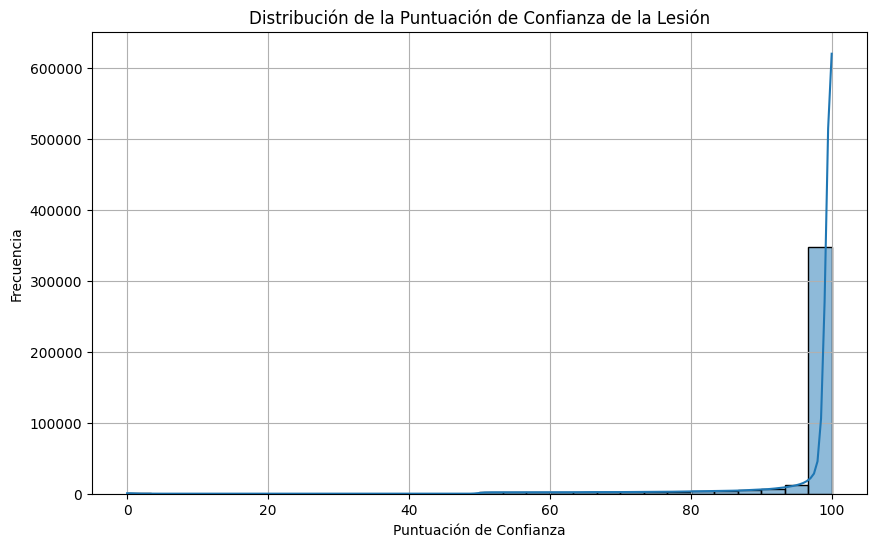

In [ ]:
# Histograma de tbp_lv_dnn_lesion_confidence
plt.figure(figsize=(10, 6))
sns.histplot(data['tbp_lv_dnn_lesion_confidence'], bins=30, kde=True)
plt.title('Distribución de la Puntuación de Confianza de la Lesión')
plt.xlabel('Puntuación de Confianza')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

podemos usar la confianza para ajustar con test un umbral en la clasificacion del target 0-1. O podemos crear 3 clases en lugar de 2: maligno con seguridad, benigno con seguridad, benigno no seguro, y maligno no seguro???

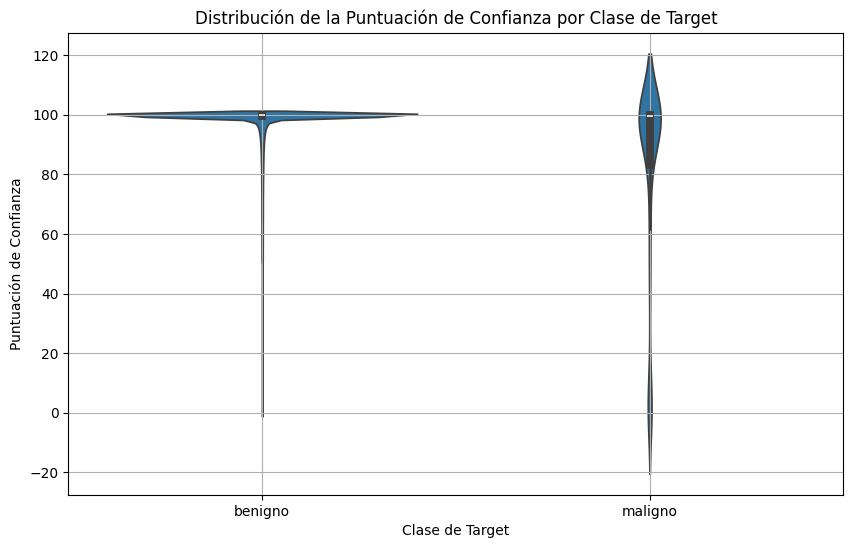

In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(x=data['target'], y=data['tbp_lv_dnn_lesion_confidence'])
plt.title('Distribución de la Puntuación de Confianza por Clase de Target')
plt.xlabel('Clase de Target')
plt.ylabel('Puntuación de Confianza')
plt.grid(True)
plt.show()

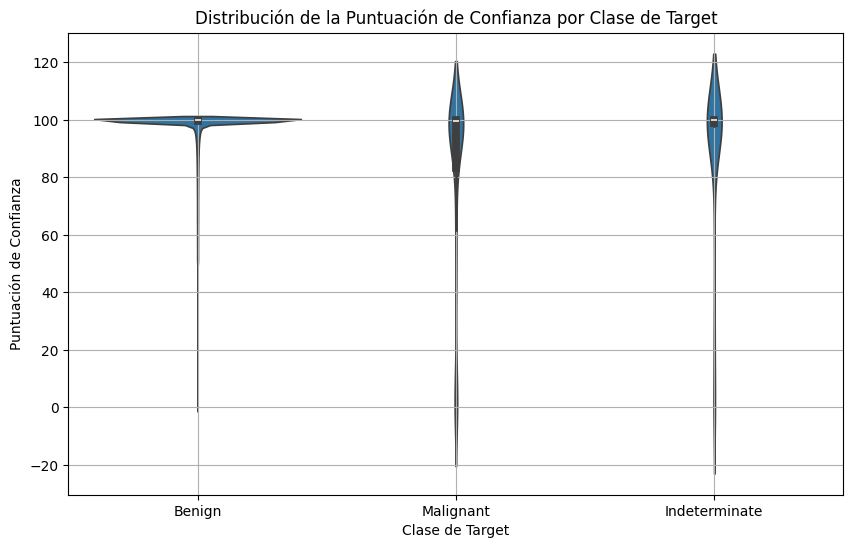

In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(x=data['iddx_1'], y=data['tbp_lv_dnn_lesion_confidence'])
plt.title('Distribución de la Puntuación de Confianza por Clase de Target')
plt.xlabel('Clase de Target')
plt.ylabel('Puntuación de Confianza')
plt.grid(True)
plt.show()

In [ ]:
data['iddx_5'].unique()

array([nan, 'Blue nevus, Cellular'], dtype=object)

In [ ]:
data['iddx_5'].value_counts()

,count
iddx_5,
"Blue nevus, Cellular",1


In [ ]:
# comprobar que el identificador unico es correcto
data['isic_id'].nunique()

401059

In [ ]:
casos_toatales =  data['isic_id'].nunique()
pacientes = data['patient_id'].nunique()
print(f'hay un total de {casos_toatales} casos totales para {pacientes} pacientes')

hay un total de 401059 casos totales para 1042 pacientes


In [ ]:
# número de casos por paciente
casos_por_paciente = data.groupby('patient_id').size()
casos_por_paciente


,0
patient_id,
IP_0008821,102
IP_0014998,352
IP_0023586,939
IP_0028775,212
IP_0028993,225
...,...
IP_9916724,221
IP_9970422,187
IP_9978624,151


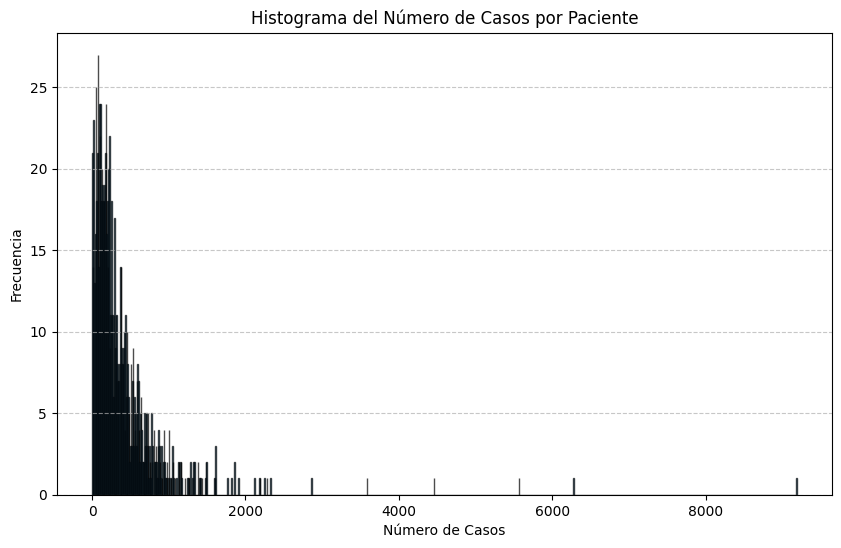

In [ ]:
# Graficar un histograma de la columna 'Numero de Casos'
plt.figure(figsize=(10, 6))
plt.hist(casos_por_paciente, bins=len(casos_por_paciente), edgecolor='black', alpha=0.7)

plt.title('Histograma del Número de Casos por Paciente')
plt.xlabel('Número de Casos')
plt.ylabel('Frecuencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [ ]:
# número máximo de casos por paciente
casos_por_paciente.max()

9184

estara relacionado el numero de lunares o imagenes con los casos de cancer? es decir: el que tiene muchos lunares al final tiene mas papeletas de tener cancer? podriamos crear una nueva variable que sea numero de casos, que seria como numero de lunares sospechosos?

In [ ]:
data['target'].value_counts()

,count
target,
benigno,400666
maligno,393


In [ ]:
pacientes_target_0 = data[data['target'] == 'benigno']['patient_id'].nunique()
pacientes_target_1 = data[data['target'] == 'maligno']['patient_id'].nunique()

print(f'Número de pacientes benignos: {pacientes_target_0} y número de pacientes con melanoma: {pacientes_target_1}')


Número de pacientes benignos: 1041 y número de pacientes con melanoma: 259


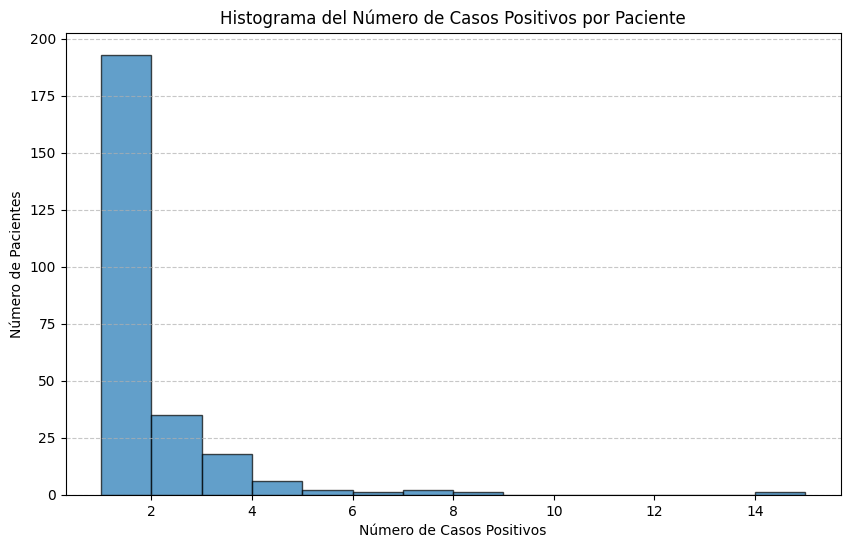

In [ ]:
# Filtrar los casos positivos
df_positivos = data[data['target'] == 'maligno']

# Contar el número de casos positivos por paciente
casos_positivos_por_paciente = df_positivos.groupby('patient_id').size()

# Graficar el histograma del número de casos positivos por paciente
plt.figure(figsize=(10, 6))
plt.hist(casos_positivos_por_paciente, bins=range(1, casos_positivos_por_paciente.max() + 2), edgecolor='black', alpha=0.7)

plt.title('Histograma del Número de Casos Positivos por Paciente')
plt.xlabel('Número de Casos Positivos')
plt.ylabel('Número de Pacientes')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [ ]:
# Identificar el paciente con el mayor número de casos positivos
paciente_max_casos = casos_positivos_por_paciente.idxmax()  # ID del paciente con más casos positivos
max_casos = casos_positivos_por_paciente.max()  # Número máximo de casos positivos

# Mostrar el paciente con el mayor número de casos positivos
print(f'Paciente con el mayor número de casos positivos: {paciente_max_casos}')
print(f'Número de casos positivos: {max_casos}')

# Opcional: Ver detalles del paciente con el mayor número de casos positivos
detalles_paciente_max = df_positivos[df_positivos['patient_id'] == paciente_max_casos]
print('Detalles del paciente con el mayor número de casos positivos:')
print(detalles_paciente_max)

Paciente con el mayor número de casos positivos: IP_2456971
Número de casos positivos: 14
Detalles del paciente con el mayor número de casos positivos:
             isic_id   target  patient_id  age_approx   sex  \
8920    ISIC_0293670  maligno  IP_2456971        60.0  male   
24099   ISIC_0664135  maligno  IP_2456971        60.0  male   
29299   ISIC_0793445  maligno  IP_2456971        60.0  male   
36354   ISIC_0968965  maligno  IP_2456971        60.0  male   
73241   ISIC_1885694  maligno  IP_2456971        60.0  male   
180894  ISIC_4558229  maligno  IP_2456971        60.0  male   
188645  ISIC_4750368  maligno  IP_2456971        60.0  male   
231320  ISIC_5814779  maligno  IP_2456971        60.0  male   
238314  ISIC_5990594  maligno  IP_2456971        60.0  male   
247497  ISIC_6218923  maligno  IP_2456971        60.0  male   
254105  ISIC_6382027  maligno  IP_2456971        60.0  male   
265953  ISIC_6665759  maligno  IP_2456971        60.0  male   
271469  ISIC_6798815  maligno

In [ ]:
# Definir el id del paciente de interés
id_paciente_interes = 'IP_2456971'

# Filtrar el DataFrame para el paciente específico
df_paciente = data[data['patient_id'] == id_paciente_interes]

# Contar el número total de casos para el paciente, tanto target 0 como 1
total_casos = len(df_paciente)
casos_target_0 = (df_paciente['target'] == 'benigno').sum()
casos_target_1 = (df_paciente['target'] == 'maligno').sum()

print(f'Número total de casos para el paciente {id_paciente_interes}: {total_casos}')
print(f'Número de casos con target 0: {casos_target_0}')
print(f'Número de casos con target 1: {casos_target_1}')

Número total de casos para el paciente IP_2456971: 445
Número de casos con target 0: 431
Número de casos con target 1: 14


In [ ]:
# TODO preguntar a Silvia porque si mantienes solo un target por paciente y hemos dicho despues que son independientes es un poco raro

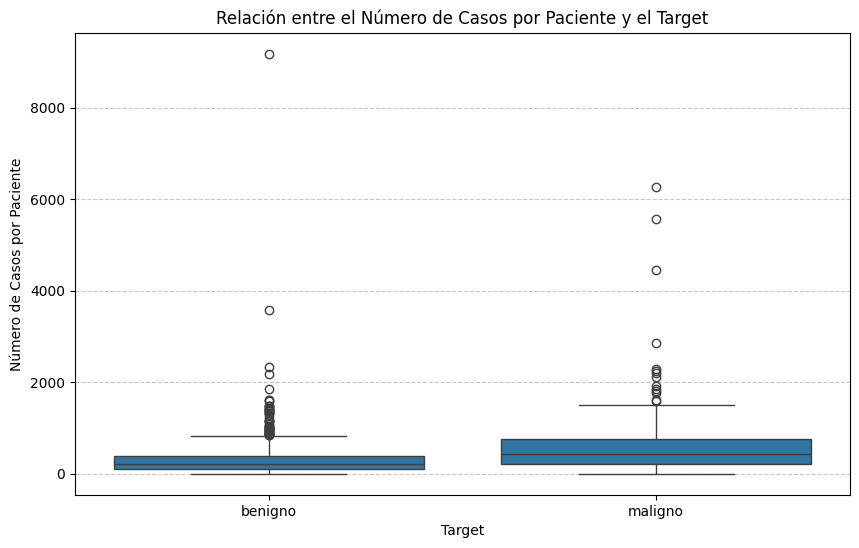

Promedio de casos para target 0: 312.96934865900386
Promedio de casos para target 1: 602.3320463320464
Valor p de la prueba t: 3.7431492897725125e-14


In [ ]:
# Contar el número de casos por paciente
casos_por_paciente = data.groupby('patient_id').size().reset_index(name='num_casos')

# Unir con el target, usando una agregación para mantener un solo target por paciente
df_pacientes = data.groupby('patient_id').agg({'target': 'max'}).reset_index()

# Unir ambos DataFrames
df_analisis = pd.merge(casos_por_paciente, df_pacientes, on='patient_id')

# Visualizar la relación entre el número de casos y el target
plt.figure(figsize=(10, 6))
sns.boxplot(x='target', y='num_casos', data=df_analisis)
plt.title('Relación entre el Número de Casos por Paciente y el Target')
plt.xlabel('Target')
plt.ylabel('Número de Casos por Paciente')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Realizar un análisis estadístico básico
grupo_0 = df_analisis[df_analisis['target'] == 'benigno']['num_casos']
grupo_1 = df_analisis[df_analisis['target'] == 'maligno']['num_casos']

print(f'Promedio de casos para target 0: {grupo_0.mean()}')
print(f'Promedio de casos para target 1: {grupo_1.mean()}')

# Prueba t para comparar los promedios
from scipy.stats import ttest_ind
t_stat, p_val = ttest_ind(grupo_0, grupo_1)
print(f'Valor p de la prueba t: {p_val}')


Es significativo, pero no lo podriamos poner como variable porque no tenemos el dato de cuantos casos hay por paciente de entrada

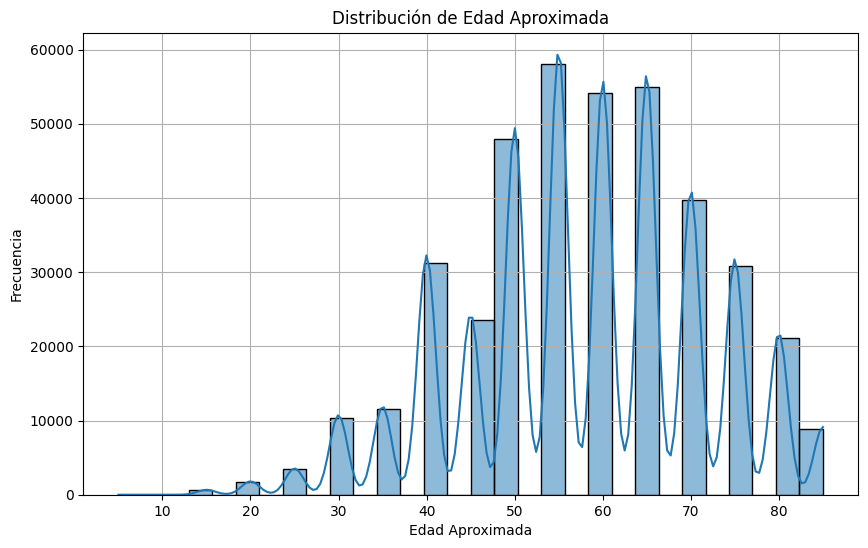

In [ ]:
# Eliminar valores nulos en age_approx
df_cleaned = data.dropna(subset=['age_approx'])

# Histograma de edades aproximadas
plt.figure(figsize=(10, 6))
sns.histplot(df_cleaned['age_approx'], bins=30, kde=True)
plt.title('Distribución de Edad Aproximada')
plt.xlabel('Edad Aproximada')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


In [ ]:
# Eliminar valores nulos en 'age_approx'
df_cleaned_age = data.dropna(subset=['age_approx'])

# Estadísticas descriptivas por target
age_stats = df_cleaned_age.groupby('target')['age_approx'].describe()
print(age_stats)


            count       mean        std   min   25%   50%   75%   max
target                                                               
benigno  397871.0  58.009694  13.597301   5.0  50.0  60.0  70.0  85.0
maligno     390.0  61.371795  11.932877  20.0  55.0  60.0  70.0  85.0


<ipython-input-40-5ced4919f634>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='target', y='age_approx', data=df_cleaned_age, palette='plasma')


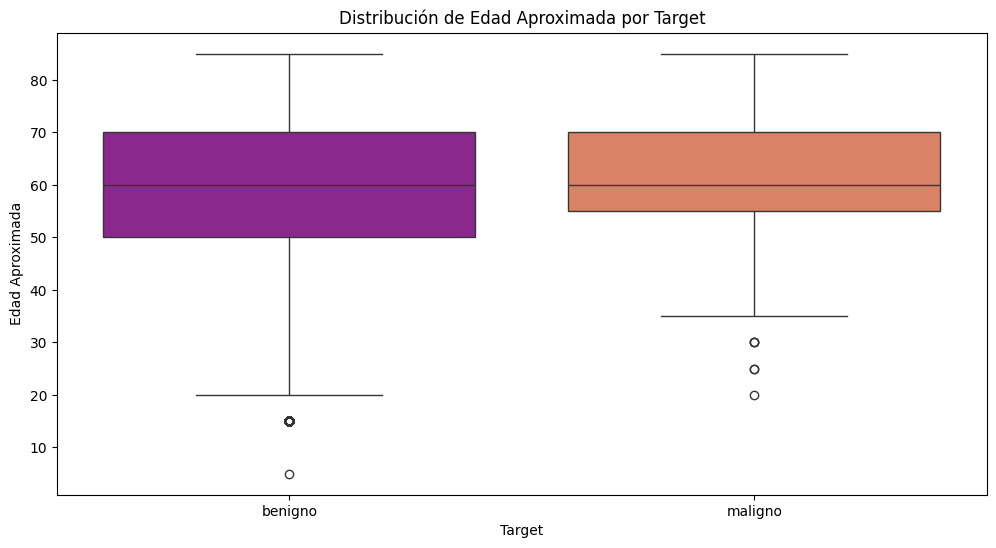

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='target', y='age_approx', data=df_cleaned_age, palette='plasma')
plt.title('Distribución de Edad Aproximada por Target')
plt.xlabel('Target')
plt.ylabel('Edad Aproximada')
plt.show()

In [ ]:
from scipy.stats import ttest_ind

# Dividir los datos por target
age_target_0 = df_cleaned_age[df_cleaned_age['target'] == 'benigno']['age_approx']
age_target_1 = df_cleaned_age[df_cleaned_age['target'] == 'maligno']['age_approx']

# Realizar prueba t
t_stat, p_value = ttest_ind(age_target_0, age_target_1, equal_var=False)  # equal_var=False para Welch's t-test

print(f'Estadístico t: {t_stat}')
print(f'Valor p: {p_value}')

Estadístico t: -5.560600333575879
Valor p: 4.9973631159001206e-08


Dado que el valor p es mucho menor que 0.05, hay una diferencia estadísticamente significativa en la edad aproximada entre los casos benignos y malignos.

<ipython-input-42-fac32019a60f>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sex_counts.index, y=sex_counts.values, palette='viridis')


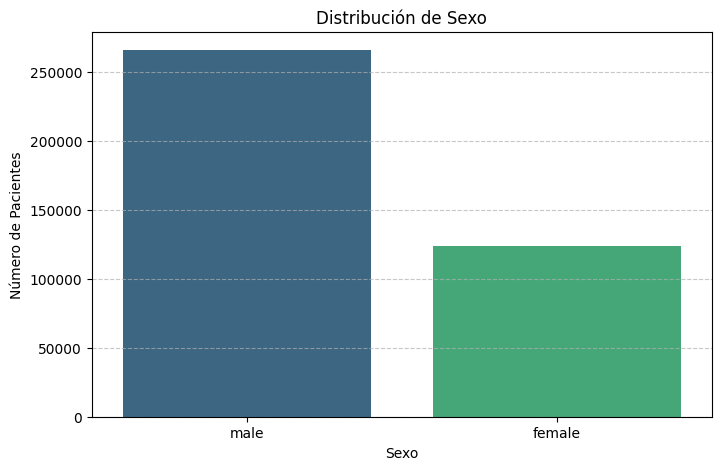

In [ ]:
# Eliminar valores nulos en sex
df_cleaned_sex = data.dropna(subset=['sex'])

# Contar la cantidad de pacientes por sexo
sex_counts = df_cleaned_sex['sex'].value_counts()

# Gráfico de barras de distribución de sexo
plt.figure(figsize=(8, 5))
sns.barplot(x=sex_counts.index, y=sex_counts.values, palette='viridis')
plt.title('Distribución de Sexo')
plt.xlabel('Sexo')
plt.ylabel('Número de Pacientes')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [ ]:
# Eliminar valores nulos en 'sex'
df_cleaned_sex = data.dropna(subset=['sex'])

# Contar la cantidad de casos por sexo y target
sex_counts = df_cleaned_sex.groupby(['sex', 'target']).size().unstack(fill_value=0)

print(sex_counts)


target  benigno  maligno
sex                     
female   123887      109
male     265272      274


In [ ]:
# Calcular proporciones para cada sexo
sex_proportions = sex_counts.div(sex_counts.sum(axis=1), axis=0)
# Calcular proporciones para cada sexo
sex_proportions = sex_counts.div(sex_counts.sum(axis=1), axis=0)

# Resetear índice para mejor visualización
sex_proportions = sex_proportions.reset_index().melt(id_vars='sex', var_name='target', value_name='proportion')

print(sex_proportions)

      sex   target  proportion
0  female  benigno    0.999121
1    male  benigno    0.998968
2  female  maligno    0.000879
3    male  maligno    0.001032


In [ ]:
# Filtrar para target == 'maligno'
df_target_1 = sex_proportions[sex_proportions['target'] == 'maligno']

print(df_target_1)


      sex   target  proportion
2  female  maligno    0.000879
3    male  maligno    0.001032


<ipython-input-46-ee8e3d92da49>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sex', y='proportion', data=df_target_1, palette='plasma')


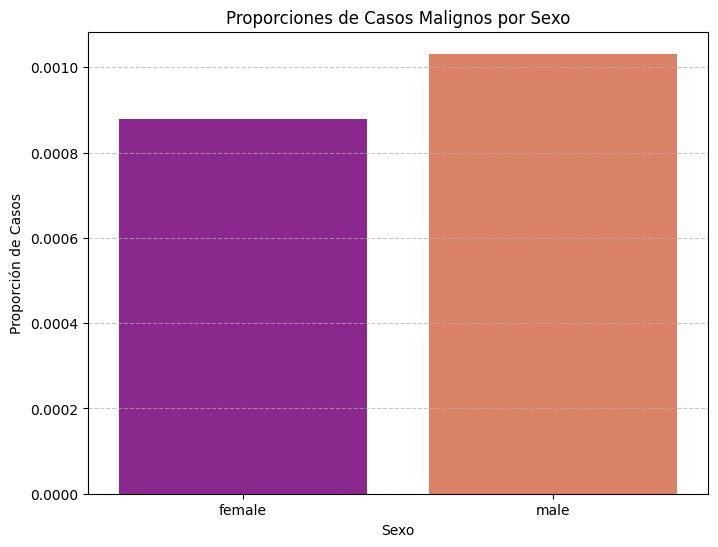

In [ ]:
plt.figure(figsize=(8, 6))
sns.barplot(x='sex', y='proportion', data=df_target_1, palette='plasma')
plt.title('Proporciones de Casos Malignos por Sexo')
plt.xlabel('Sexo')
plt.ylabel('Proporción de Casos')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
from scipy.stats import chi2_contingency

# Crear una tabla de contingencia
contingency_table_sex = pd.crosstab(df_cleaned_sex['sex'], df_cleaned_sex['target'])

# Realizar la prueba de chi-cuadrado
chi2, p_value, dof, expected = chi2_contingency(contingency_table_sex)

print(f'Chi2: {chi2}')
print(f'Valor p: {p_value}')
print(f'Degrees of Freedom (dof): {dof}')
print(f'Tabla de Frecuencias Esperadas: \n{expected}')

Chi2: 1.8560306694719215
Valor p: 0.17308361777911274
Degrees of Freedom (dof): 1
Tabla de Frecuencias Esperadas: 
[[1.23874086e+05 1.21913601e+02]
 [2.65284914e+05 2.61086399e+02]]


No hay evidencia estadísticamente significativa para sugerir que el sexo esté asociado con el target en este conjunto de datos. Las diferencias observadas en la distribución de casos malignos entre sexos podrían ser debidas al azar.

<ipython-input-48-fb624b23126d>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=anatom_counts.index, y=anatom_counts.values, palette='plasma')


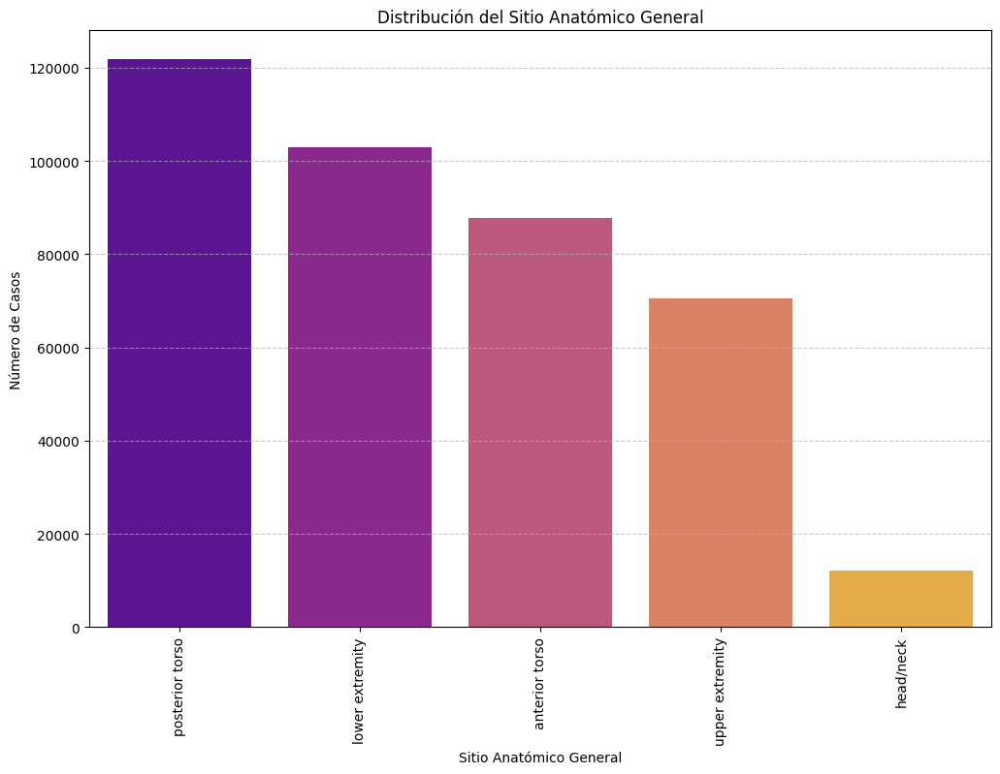

In [ ]:
# Eliminar valores nulos en anatom_site_general
df_cleaned_anatom = data.dropna(subset=['anatom_site_general'])

# Contar la cantidad de casos por sitio anatómico
anatom_counts = df_cleaned_anatom['anatom_site_general'].value_counts()

# Gráfico de barras de distribución de sitio anatómico general
plt.figure(figsize=(12, 8))
sns.barplot(x=anatom_counts.index, y=anatom_counts.values, palette='plasma')
plt.title('Distribución del Sitio Anatómico General')
plt.xlabel('Sitio Anatómico General')
plt.ylabel('Número de Casos')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [ ]:
# Eliminar valores nulos en anatom_site_general
df_cleaned_anatom = data.dropna(subset=['anatom_site_general'])

# Contar la cantidad de casos por sitio anatómico para cada target
anatom_counts = df_cleaned_anatom.groupby(['target', 'anatom_site_general']).size().reset_index(name='count')

# Mostrar el resumen
print(anatom_counts)

# Mostrar sólo los datos para target='maligno'
target_1_summary = anatom_counts[anatom_counts['target'] == 'maligno']
print("\nResumen para Target 1:")
print(target_1_summary)

# Mostrar sólo los datos para target=0
target_0_summary = anatom_counts[anatom_counts['target'] == 'benigno']
print("\nResumen para Target 0:")
print(target_0_summary)

    target anatom_site_general   count
0  benigno      anterior torso   87688
1  benigno           head/neck   11968
2  benigno     lower extremity  102955
3  benigno     posterior torso  121799
4  benigno     upper extremity   70500
5  maligno      anterior torso      82
6  maligno           head/neck      78
7  maligno     lower extremity      73
8  maligno     posterior torso     103
9  maligno     upper extremity      57

Resumen para Target 1:
    target anatom_site_general  count
5  maligno      anterior torso     82
6  maligno           head/neck     78
7  maligno     lower extremity     73
8  maligno     posterior torso    103
9  maligno     upper extremity     57

Resumen para Target 0:
    target anatom_site_general   count
0  benigno      anterior torso   87688
1  benigno           head/neck   11968
2  benigno     lower extremity  102955
3  benigno     posterior torso  121799
4  benigno     upper extremity   70500


In [ ]:
# Contar la cantidad de casos por sitio anatómico para cada target
counts = df_cleaned_anatom.groupby(['target', 'anatom_site_general']).size().unstack(fill_value=0)

# Calcular proporciones
proportions = counts.div(counts.sum(axis=1), axis=0)

# Resetear índice para mejor visualización
proportions = proportions.reset_index().melt(id_vars='target', var_name='anatom_site_general', value_name='proportion')

print(proportions)


    target anatom_site_general  proportion
0  benigno      anterior torso    0.222046
1  maligno      anterior torso    0.208651
2  benigno           head/neck    0.030306
3  maligno           head/neck    0.198473
4  benigno     lower extremity    0.260705
5  maligno     lower extremity    0.185751
6  benigno     posterior torso    0.308422
7  maligno     posterior torso    0.262087
8  benigno     upper extremity    0.178522
9  maligno     upper extremity    0.145038


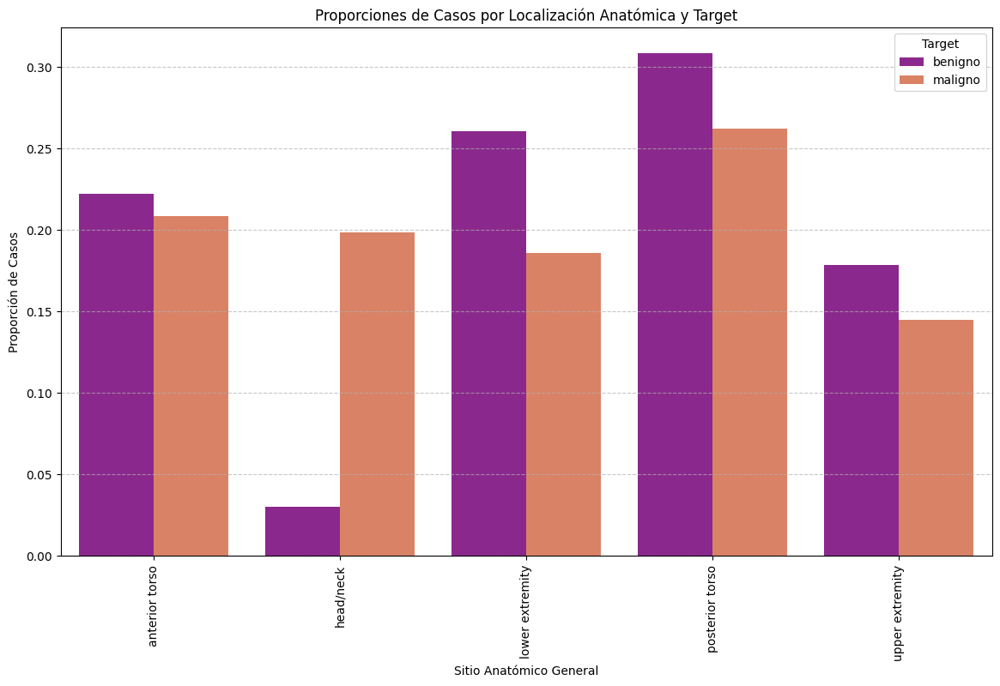

In [ ]:
# Crear el gráfico de proporciones
plt.figure(figsize=(14, 8))
sns.barplot(x='anatom_site_general', y='proportion', hue='target', data=proportions, palette='plasma')
plt.title('Proporciones de Casos por Localización Anatómica y Target')
plt.xlabel('Sitio Anatómico General')
plt.ylabel('Proporción de Casos')
plt.xticks(rotation=90)
plt.legend(title='Target')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

La proporción de malignos es mayor que los benignos cuando están localizados en la cabeza o cuello de los pacientes. Por lo que podria indicar que la probabilidad de que sea maligno en esta localizacion concreta es mayor.

Se eliminan las columnas que no van a utilizarse en el modelo para la posterior selección de las muestras del problema.

In [ ]:
data = data.drop(['mel_mitotic_index', 'mel_thick_mm','image_type','tbp_tile_type',
                  'copyright_license','attribution','lesion_id', 'iddx_1','iddx_2', 'iddx_3', 'iddx_4', 'iddx_5',
                  'iddx_full', 'tbp_lv_x', 'tbp_lv_y', 'tbp_lv_z', 'tbp_lv_nevi_confidence'], axis=1)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401059 entries, 0 to 401058
Data columns (total 38 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   isic_id                       401059 non-null  object 
 1   target                        401059 non-null  object 
 2   patient_id                    401059 non-null  object 
 3   age_approx                    398261 non-null  float64
 4   sex                           389542 non-null  object 
 5   anatom_site_general           395303 non-null  object 
 6   clin_size_long_diam_mm        401059 non-null  float64
 7   tbp_lv_A                      401059 non-null  float64
 8   tbp_lv_Aext                   401059 non-null  float64
 9   tbp_lv_B                      401059 non-null  float64
 10  tbp_lv_Bext                   401059 non-null  float64
 11  tbp_lv_C                      401059 non-null  float64
 12  tbp_lv_Cext                   401059 non-nul

In [ ]:
data = data.dropna(subset=['sex', 'age_approx', 'anatom_site_general'])

### Analisis exploratorio de las variables numéricas

In [ ]:
numeric_columns = ['tbp_lv_A', 'tbp_lv_Aext', 'tbp_lv_B', 'tbp_lv_Bext', 'tbp_lv_C', 'tbp_lv_Cext',
                   'tbp_lv_H', 'tbp_lv_Hext', 'tbp_lv_L', 'tbp_lv_Lext', 'tbp_lv_areaMM2',
                   'tbp_lv_area_perim_ratio', 'tbp_lv_color_std_mean', 'tbp_lv_deltaA',
                   'tbp_lv_deltaB', 'tbp_lv_deltaL', 'tbp_lv_deltaLB', 'tbp_lv_deltaLBnorm',
                   'tbp_lv_eccentricity', 'tbp_lv_minorAxisMM', 'tbp_lv_norm_border',
                   'tbp_lv_norm_color', 'tbp_lv_perimeterMM', 'tbp_lv_radial_color_std_max',
                   'tbp_lv_stdL', 'tbp_lv_stdLExt', 'tbp_lv_symm_2axis', 'tbp_lv_symm_2axis_angle']

# Generar resumen estadístico
summary_stats = data[numeric_columns].describe()
print(summary_stats)

            tbp_lv_A    tbp_lv_Aext       tbp_lv_B    tbp_lv_Bext  \
count  381914.000000  381914.000000  381914.000000  381914.000000   
mean       19.949312      14.907976      28.170619      26.805857   
std         3.983557       3.511679       5.229249       4.437515   
min        -2.487115      -9.080269      -0.730989       9.237066   
25%        17.322385      12.474831      24.635740      23.782231   
50%        19.778390      14.708640      28.068779      26.601681   
75%        22.267498      17.118785      31.487008      29.528269   
max        48.189610      37.021680      54.306900      48.372700   

            tbp_lv_C    tbp_lv_Cext       tbp_lv_H    tbp_lv_Hext  \
count  381914.000000  381914.000000  381914.000000  381914.000000   
mean       34.680555      30.821552      54.585460      60.920549   
std         5.659655       4.780907       5.511701       5.627095   
min         3.054228      11.846520      -1.574164      28.436490   
25%        30.934328      27.5951

<Figure size 2000x1500 with 0 Axes>

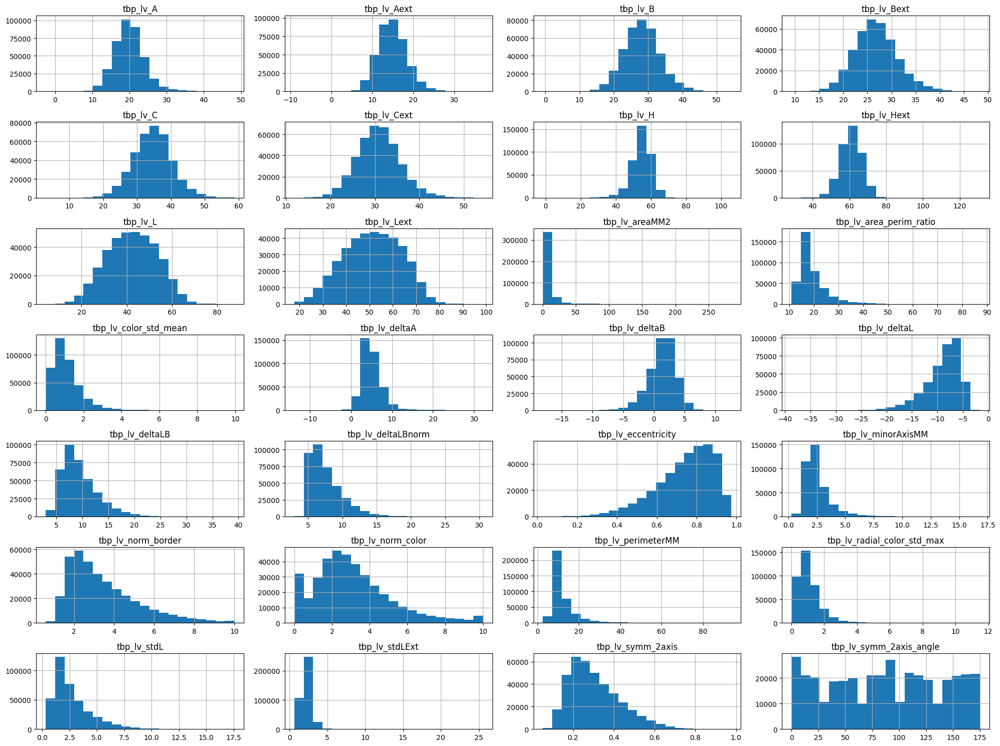

In [ ]:
# Visualizar distribuciones con histogramas
plt.figure(figsize=(20, 15))
data[numeric_columns].hist(bins=20, figsize=(20, 15), layout=(7, 4))
plt.tight_layout()
plt.show()

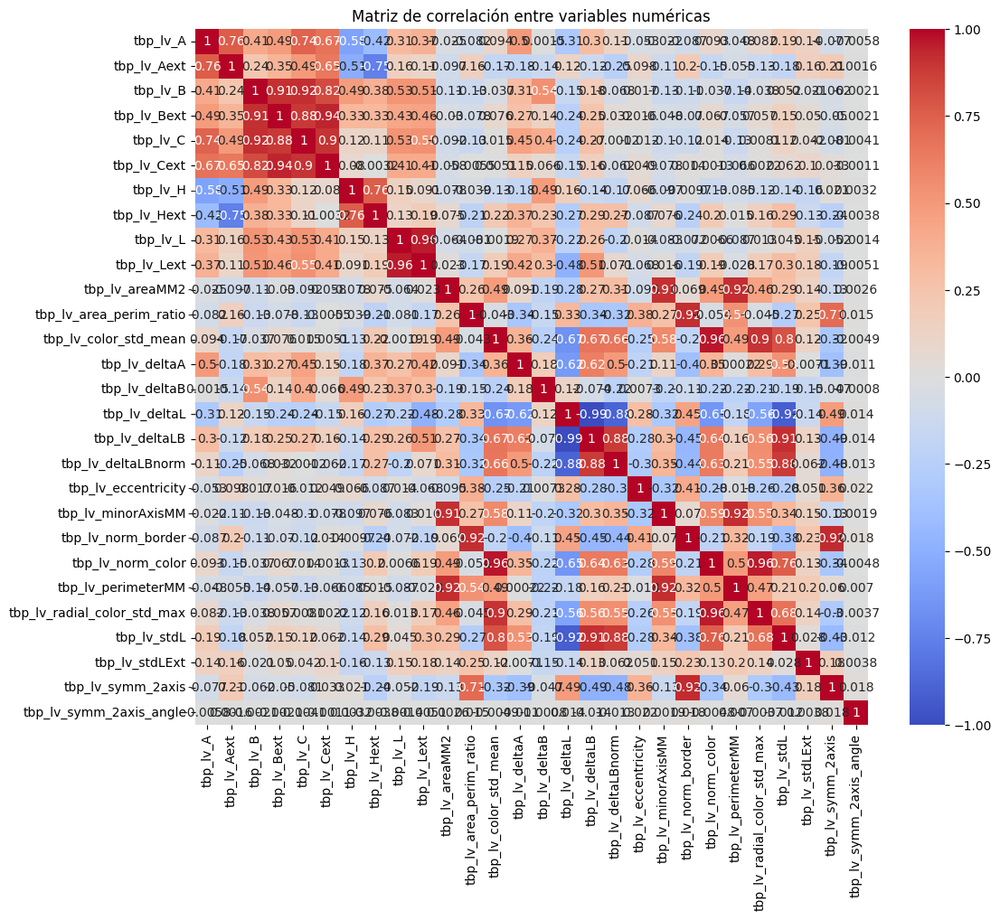

In [ ]:
# Calcular la correlación entre las variables numéricas
correlation_matrix = data[numeric_columns].corr()

# Visualizar la matriz de correlación con un mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de correlación entre variables numéricas')
plt.show()

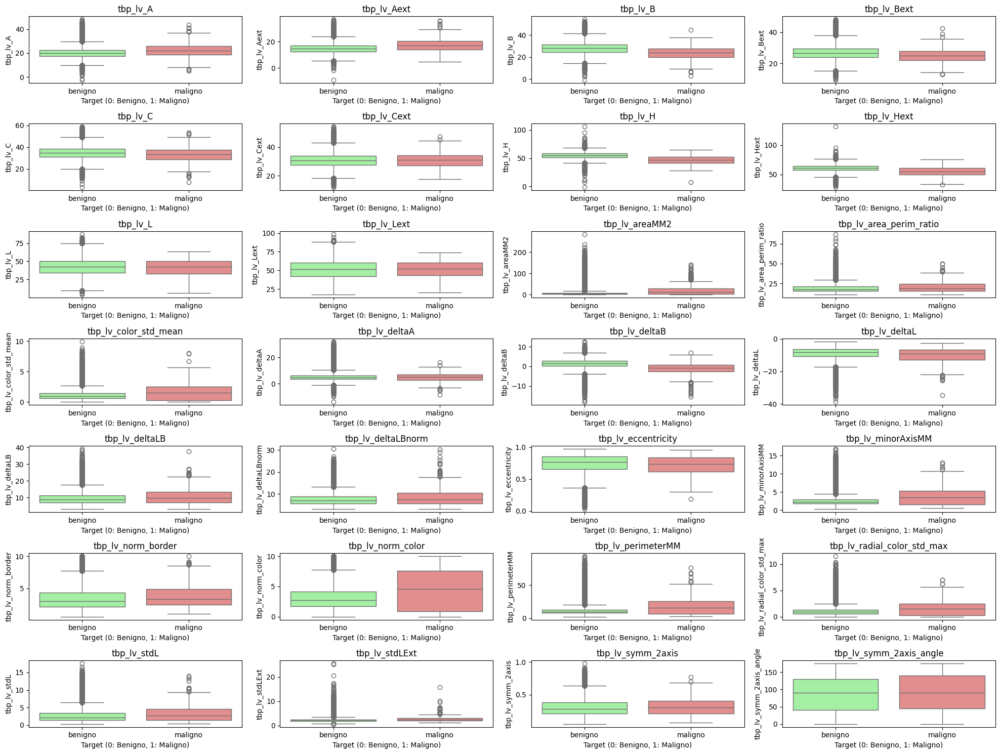

In [ ]:
import warnings
# Ocultar FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)
# Visualizar los boxplots separados por clases (maligno vs benigno)
# Definir los colores pastel para benigno (verde) y maligno (rojo)
colors = {'benigno': "palegreen", 'maligno': "lightcoral"}
# Visualizar los boxplots separados por clases (maligno vs benigno) con colores diferentes
plt.figure(figsize=(20, 15))
for i, col in enumerate(numeric_columns, 1):
    plt.subplot(7, 4, i)
    sns.boxplot(x=data['target'], y=data[col], palette=colors)  # Colores según target
    plt.title(col)
    plt.xlabel('Target (0: Benigno, 1: Maligno)')  # Etiqueta del eje x para mayor claridad

plt.tight_layout()
plt.show()

In [ ]:
pacientes_target_1 = data[data['target'] == 'maligno']['patient_id'].nunique()
pacientes_target_1

249

## Selección de las muestras para train, val y test

¿Hay pacientes con muestras en los dos subconjuntos? (cancer no cancer)

In [ ]:
# Agrupar por patient_id y contar los valores únicos de target
patients_with_both_targets = data.groupby('patient_id')['target'].nunique()

# Filtrar los patient_id que tienen ambos valores (0 y 1)
patients_with_both_targets = patients_with_both_targets[patients_with_both_targets > 1]
print(patients_with_both_targets)

patient_id
IP_0023586    2
IP_0076153    2
IP_0135517    2
IP_0152575    2
IP_0159369    2
             ..
IP_9801595    2
IP_9807499    2
IP_9847192    2
IP_9978624    2
IP_9989989    2
Name: target, Length: 248, dtype: int64


In [ ]:
data_patients_both = data[data['patient_id'].isin(patients_with_both_targets.index)]

# Contar las muestras con target 0 de los patient_id que tienen ambos valores
count_target_0 = data_patients_both[data_patients_both['target'] == 'benigno']['patient_id'].values
print(f'En total hay {len(data_patients_both)} muestras de pacientes que tienen ambos target de las que no cancer son {len(count_target_0)} con target 0 y {len(data_patients_both)-len(count_target_0)} son target 1')

En total hay 150196 muestras de pacientes que tienen ambos target de las que no cancer son 149816 con target 0 y 380 son target 1


Como un mismo paciente puede llegar a tener muchas muestras (6000) consideramos que no son 6000 lunares al mismo tiempo sino en momentos diferentes (ya que al principio comprobamos que no tenian muestras duplicadas).Por este motivo deducimos que es posible que algunas de las muestras que son de un mismo paciente pueden ser lunares que pasaron de no se malignos a serlo.

Es interesante que todas las muestras de un paciente esten en el mismo conjunto (train, val, test).

En total tenemos 989 pacientes en total y 249 con melanoma. Las 381 muestras de cancer perteneces a 249 pacientes que tienen tambien otras muestras que no son cancer.


In [ ]:
# Paso 1: Filtrar todas las filas donde 'target' es 1 y 0 por separado
data_target_1 = data[data['target'] == 'maligno']
data_target_0 = data[data['target'] == 'benigno']

In [ ]:
from sklearn.model_selection import train_test_split
# Paso 2: Hago split del target 1 de los pacientes para tener tres conjuntos con target 1 y 0 ya que los pacientes de target 1 tambien tienen muestras con target 0 como hemos visto

# Obtener los patient_id únicos
unique_patients = data_target_1['patient_id'].unique()

# Usar train_test_split en los patient_id únicos
train_patients, ttemp_patients = train_test_split(unique_patients, test_size=0.3, random_state=0)
val_patients, test_patients = train_test_split(ttemp_patients, test_size=0.5, random_state=0)


In [ ]:
len(train_patients), len(val_patients), len(test_patients)

(174, 37, 38)

In [ ]:
# Paso 3: Hacer split con los pacientes que solo tienen muestras en target 0 (eliminando los pacientes que ya hemos repartido)
# Obtener los patient_id únicos
unique_patients_0_1 = data_target_0['patient_id'].unique()
# Usar sets para eliminar los elementos
unique_patients_0 = list(set(unique_patients_0_1) - set(unique_patients))

# Usar train_test_split en los patient_id únicos
train_patients_0, ttemp_patients_0 = train_test_split(unique_patients_0, test_size=0.3, random_state=0)
val_patients_0, test_patients_0 = train_test_split(ttemp_patients_0, test_size=0.5, random_state=0)


In [ ]:
len(train_patients_0), len(val_patients_0), len(test_patients_0)

(518, 111, 111)

In [ ]:
# Paso 4: creo los conjuntos de datos con data a partir de los pacientes para cada tipo
train_df_0 = data[data['patient_id'].isin(train_patients_0)]
val_df_0 = data[data['patient_id'].isin(val_patients_0)]
test_df_0 = data[data['patient_id'].isin(test_patients_0)]
train_df_0.shape, val_df_0.shape, test_df_0.shape

((151360, 38), (39298, 38), (41059, 38))

In [ ]:
train_df_0_1 = data[data['patient_id'].isin(train_patients)]
val_df_0_1 = data[data['patient_id'].isin(val_patients)]
test_df_0_1 = data[data['patient_id'].isin(test_patients)]
train_df_0_1.shape, val_df_0_1.shape, test_df_0_1.shape

((95373, 38), (17671, 38), (37153, 38))

In [ ]:
# 0.7   0.15   0.15
# Obtener muestras de entrenamiento, validación y prueba
train_df_0_1_custom = obtener_muestras(train_df_0_1, 700)
val_df_0_1_custom = obtener_muestras(val_df_0_1, 150)
test_df_0_1_custom = obtener_muestras(test_df_0_1, 150)
# Coger del df de target 0 y 1 en 700 150 y 150 teniendo en cuenta que tenemos que coger todas las muestras de cancer
# Seleccionar muestras adicionales aleatorias de target != 1
train_df_0_custom = train_df_0.sample(n=700, random_state=0)
val_df_0_custom = val_df_0.sample(n=150, random_state=0)
test_df_0_custom = test_df_0.sample(n=150, random_state=0)

In [ ]:
train_df_0_1_custom.shape, val_df_0_1_custom.shape, test_df_0_1_custom.shape, train_df_0_custom.shape, val_df_0_custom.shape, test_df_0_custom.shape

((700, 38), (150, 38), (150, 38), (700, 38), (150, 38), (150, 38))

In [ ]:
train_df = pd.concat([train_df_0_1_custom, train_df_0_custom], axis=0)
val_df = pd.concat([val_df_0_1_custom, val_df_0_custom], axis=0)
test_df = pd.concat([test_df_0_1_custom, test_df_0_custom], axis=0)
train_df.shape, val_df.shape, test_df.shape

((1400, 38), (300, 38), (300, 38))

In [ ]:
# Asegurarse de que el resultado esté barajado
train_df = shuffle(train_df, random_state=0)
val_df = shuffle(val_df, random_state=0)
test_df = shuffle(test_df, random_state=0)

In [ ]:
# train_df.to_csv(base_path + 'seleccion_2000/train_df.csv', index=False)
# val_df.to_csv(base_path + 'seleccion_2000/val_df.csv', index=False)
# test_df.to_csv(base_path + 'seleccion_2000/test_df.csv', index=False)

### Graficas y metricas del conjunto que formarian train, val y test

Para analizar si se mantiene el mismo tipo de estructura que el original vamos a ver algunas graficas y metricas del conjunto train, val y test unidos como si fuera el dataframe original

In [ ]:
data_custom = pd.concat([train_df, val_df, test_df], axis=0)
data_custom.shape

(2000, 38)

In [ ]:
import matplotlib.image as mpimg
import os

In [ ]:
data_custom.columns

Index(['isic_id', 'target', 'patient_id', 'age_approx', 'sex',
       'anatom_site_general', 'clin_size_long_diam_mm', 'tbp_lv_A',
       'tbp_lv_Aext', 'tbp_lv_B', 'tbp_lv_Bext', 'tbp_lv_C', 'tbp_lv_Cext',
       'tbp_lv_H', 'tbp_lv_Hext', 'tbp_lv_L', 'tbp_lv_Lext', 'tbp_lv_areaMM2',
       'tbp_lv_area_perim_ratio', 'tbp_lv_color_std_mean', 'tbp_lv_deltaA',
       'tbp_lv_deltaB', 'tbp_lv_deltaL', 'tbp_lv_deltaLB',
       'tbp_lv_deltaLBnorm', 'tbp_lv_eccentricity', 'tbp_lv_location',
       'tbp_lv_location_simple', 'tbp_lv_minorAxisMM', 'tbp_lv_norm_border',
       'tbp_lv_norm_color', 'tbp_lv_perimeterMM',
       'tbp_lv_radial_color_std_max', 'tbp_lv_stdL', 'tbp_lv_stdLExt',
       'tbp_lv_symm_2axis', 'tbp_lv_symm_2axis_angle',
       'tbp_lv_dnn_lesion_confidence'],
      dtype='object')

In [ ]:
data_custom['tbp_lv_dnn_lesion_confidence'].min(), data_custom['tbp_lv_dnn_lesion_confidence'].max()

(2.25657945662761e-06, 100.0)

In [ ]:
len(data_custom[data_custom['tbp_lv_dnn_lesion_confidence'] < 50])

62

en proporcion es mayor que con todo el dataset

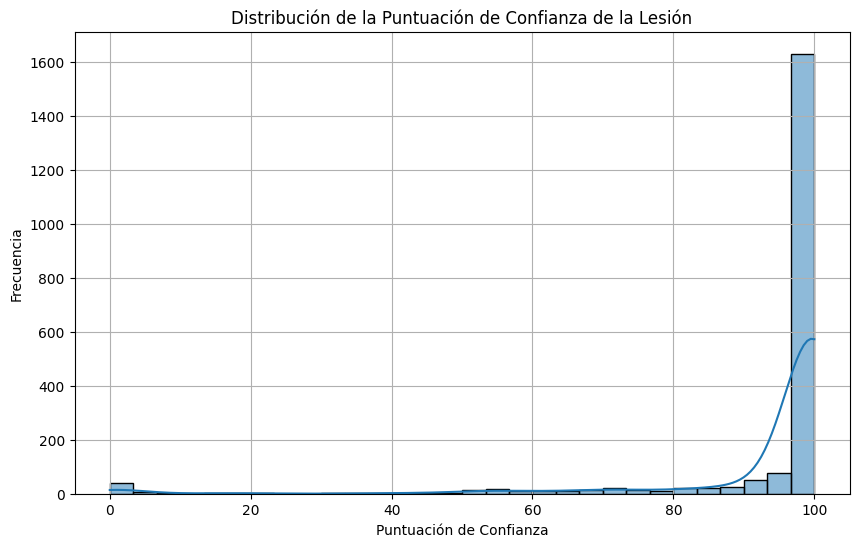

In [ ]:
# Histograma de tbp_lv_dnn_lesion_confidence
plt.figure(figsize=(10, 6))
sns.histplot(data_custom['tbp_lv_dnn_lesion_confidence'], bins=30, kde=True)
plt.title('Distribución de la Puntuación de Confianza de la Lesión')
plt.xlabel('Puntuación de Confianza')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

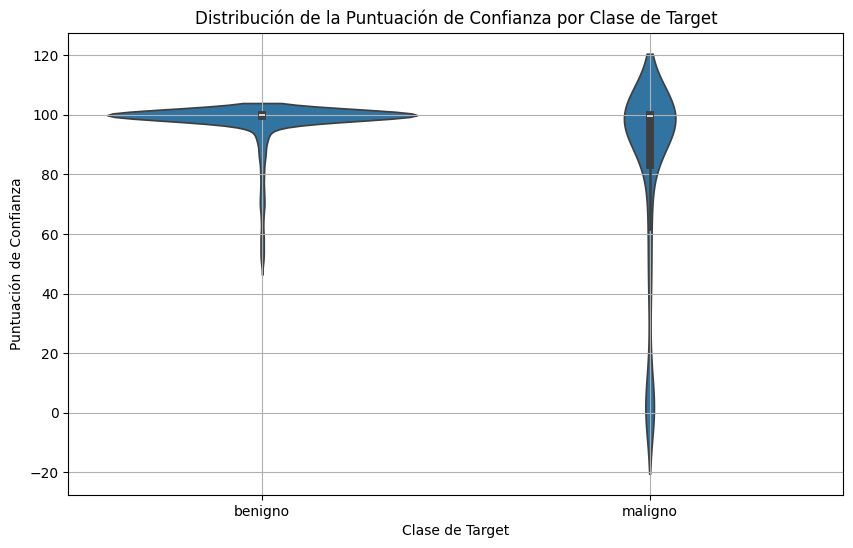

In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(x=data_custom['target'], y=data_custom['tbp_lv_dnn_lesion_confidence'])
plt.title('Distribución de la Puntuación de Confianza por Clase de Target')
plt.xlabel('Clase de Target')
plt.ylabel('Puntuación de Confianza')
plt.grid(True)
plt.show()

In [ ]:
# número de casos por paciente
casos_por_paciente = data_custom.groupby('patient_id').size()

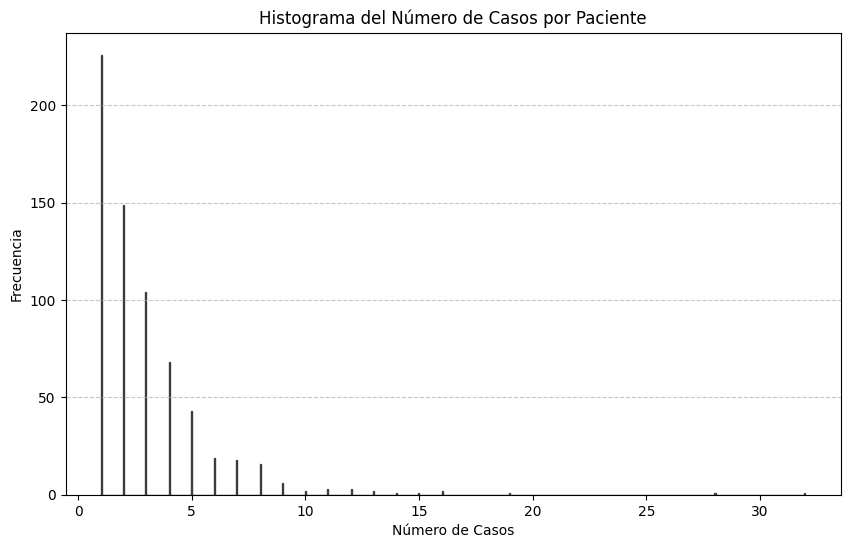

In [ ]:
# Graficar un histograma de la columna 'Numero de Casos'
plt.figure(figsize=(10, 6))
plt.hist(casos_por_paciente, bins=len(casos_por_paciente), edgecolor='black', alpha=0.7)

plt.title('Histograma del Número de Casos por Paciente')
plt.xlabel('Número de Casos')
plt.ylabel('Frecuencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

In [ ]:
# número máximo de casos por paciente
casos_por_paciente.max()

32

In [ ]:
pacientes_target_0 = data_custom[data_custom['target'] == 'benigno']['patient_id'].nunique()
pacientes_target_1 = data_custom[data_custom['target'] == 'maligno']['patient_id'].nunique()

print(f'Número de pacientes benignos: {pacientes_target_0} y número de pacientes con melanoma: {pacientes_target_1}')

Número de pacientes benignos: 605 y número de pacientes con melanoma: 249


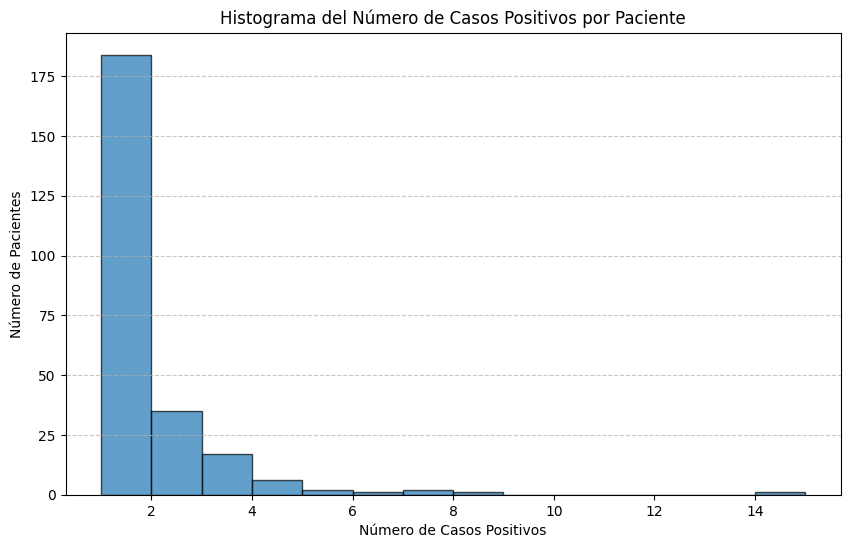

In [ ]:
# Filtrar los casos positivos
df_positivos = data_custom[data_custom['target'] == 'maligno']

# Contar el número de casos positivos por paciente
casos_positivos_por_paciente = df_positivos.groupby('patient_id').size()

# Graficar el histograma del número de casos positivos por paciente
plt.figure(figsize=(10, 6))
plt.hist(casos_positivos_por_paciente, bins=range(1, casos_positivos_por_paciente.max() + 2), edgecolor='black', alpha=0.7)

plt.title('Histograma del Número de Casos Positivos por Paciente')
plt.xlabel('Número de Casos Positivos')
plt.ylabel('Número de Pacientes')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

<ipython-input-82-3d53815e04b9>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='target', y='age_approx', data=data_custom, palette='plasma')


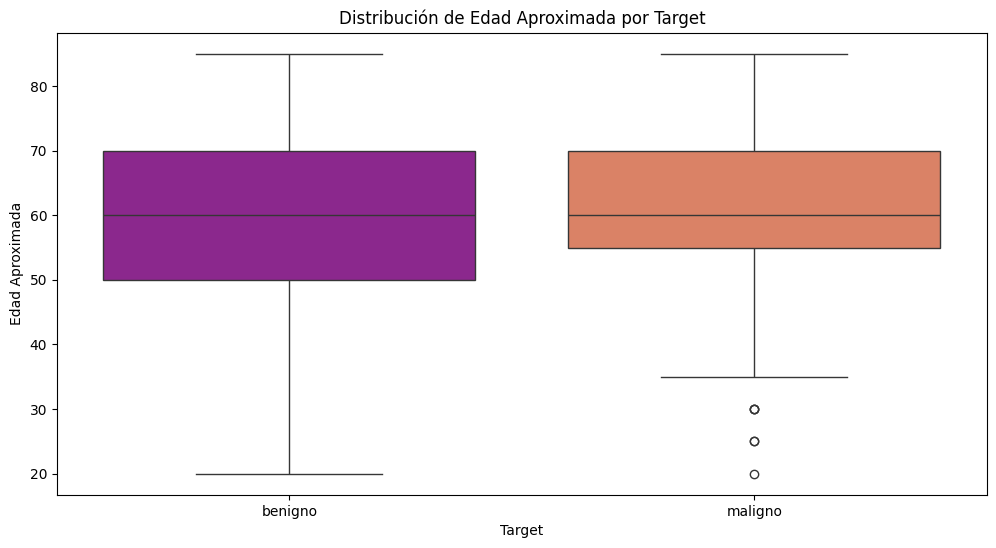

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='target', y='age_approx', data=data_custom, palette='plasma')
plt.title('Distribución de Edad Aproximada por Target')
plt.xlabel('Target')
plt.ylabel('Edad Aproximada')
plt.show()

<ipython-input-83-386c2bd9a30d>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=sex_counts.index, y=sex_counts.values, palette='viridis')


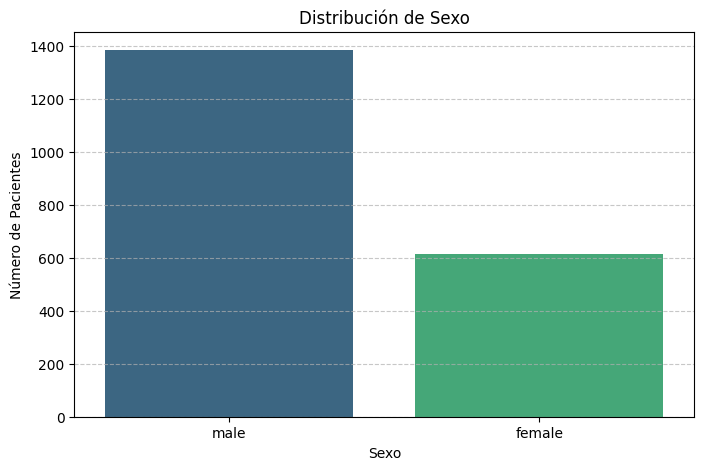

In [ ]:
# Contar la cantidad de pacientes por sexo
sex_counts = data_custom['sex'].value_counts()
# Gráfico de barras de distribución de sexo
plt.figure(figsize=(8, 5))
sns.barplot(x=sex_counts.index, y=sex_counts.values, palette='viridis')
plt.title('Distribución de Sexo')
plt.xlabel('Sexo')
plt.ylabel('Número de Pacientes')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
# Contar la cantidad de casos por sexo y target
sex_counts = data_custom.groupby(['sex', 'target']).size().unstack(fill_value=0)
# Calcular proporciones para cada sexo
sex_proportions = sex_counts.div(sex_counts.sum(axis=1), axis=0)
# Calcular proporciones para cada sexo
sex_proportions = sex_counts.div(sex_counts.sum(axis=1), axis=0)

# Resetear índice para mejor visualización
sex_proportions = sex_proportions.reset_index().melt(id_vars='sex', var_name='target', value_name='proportion')

print(sex_proportions)

      sex   target  proportion
0  female  benigno    0.826299
1    male  benigno    0.802023
2  female  maligno    0.173701
3    male  maligno    0.197977


<ipython-input-85-167e62ac42f9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='sex', y='proportion', data=df_target_1, palette='plasma')


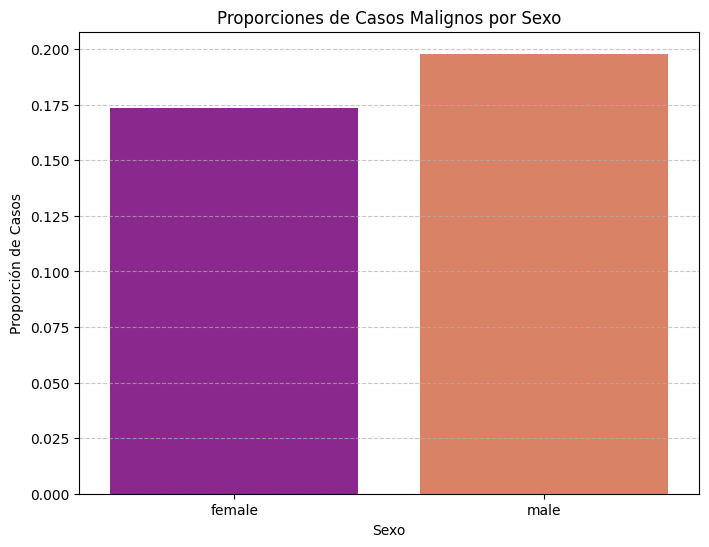

In [ ]:
df_target_1 = sex_proportions[sex_proportions['target'] == 'maligno']
plt.figure(figsize=(8, 6))
sns.barplot(x='sex', y='proportion', data=df_target_1, palette='plasma')
plt.title('Proporciones de Casos Malignos por Sexo')
plt.xlabel('Sexo')
plt.ylabel('Proporción de Casos')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

<ipython-input-86-29792a0bfd28>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=anatom_counts.index, y=anatom_counts.values, palette='plasma')


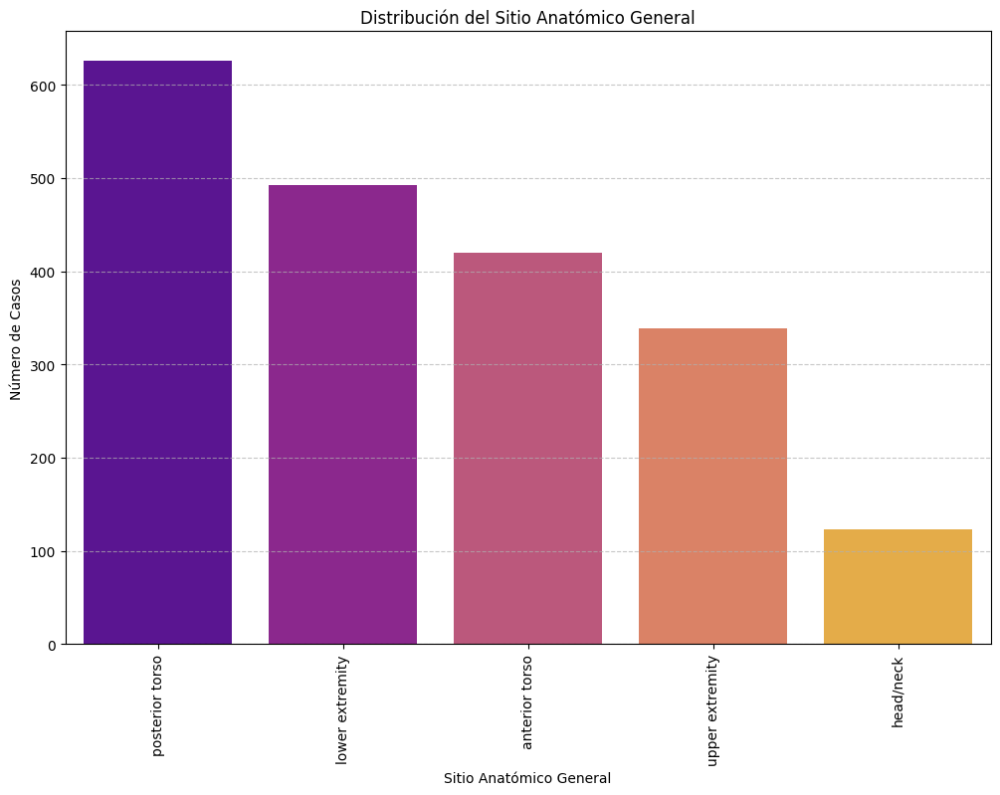

In [ ]:
# Contar la cantidad de casos por sitio anatómico
anatom_counts = data_custom['anatom_site_general'].value_counts()
# Gráfico de barras de distribución de sitio anatómico general
plt.figure(figsize=(12, 8))
sns.barplot(x=anatom_counts.index, y=anatom_counts.values, palette='plasma')
plt.title('Distribución del Sitio Anatómico General')
plt.xlabel('Sitio Anatómico General')
plt.ylabel('Número de Casos')
plt.xticks(rotation=90)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
# Contar la cantidad de casos por sitio anatómico para cada target
counts = data_custom.groupby(['target', 'anatom_site_general']).size().unstack(fill_value=0)

# Calcular proporciones
proportions = counts.div(counts.sum(axis=1), axis=0)

# Resetear índice para mejor visualización
proportions = proportions.reset_index().melt(id_vars='target', var_name='anatom_site_general', value_name='proportion')

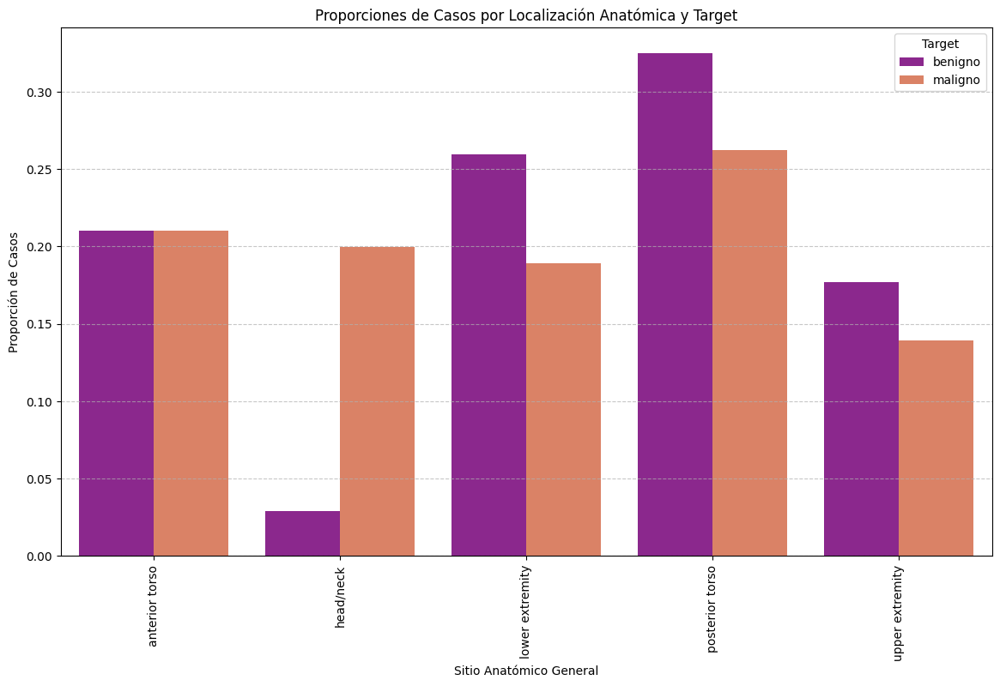

In [ ]:
# Crear el gráfico de proporciones
plt.figure(figsize=(14, 8))
sns.barplot(x='anatom_site_general', y='proportion', hue='target', data=proportions, palette='plasma')
plt.title('Proporciones de Casos por Localización Anatómica y Target')
plt.xlabel('Sitio Anatómico General')
plt.ylabel('Proporción de Casos')
plt.xticks(rotation=90)
plt.legend(title='Target')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

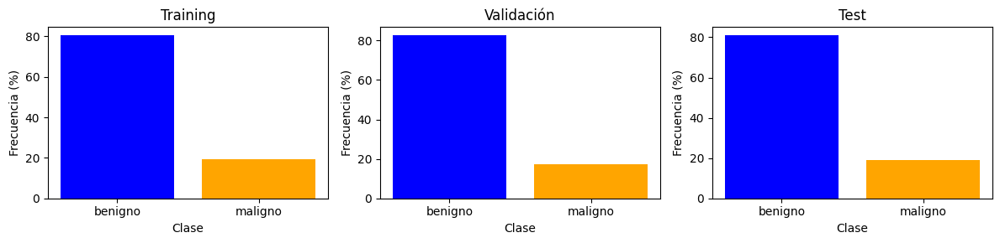

In [ ]:
# Figura y subplots para Training, Validation y Test
plt.figure(figsize=(12, 3))

# Gráfico para el conjunto de entrenamiento
ax = plt.subplot(1, 3, 1)
clases, counts = np.unique(train_df["target"], return_counts=True)
plt.bar(clases, 100 * counts / len(train_df), color=["blue", "orange"])
plt.title('Training')
plt.xlabel('Clase')
plt.ylabel('Frecuencia (%)')
ax.set_xticks(np.arange(len(clases)))
ax.set_xticklabels(clases)

# Gráfico para el conjunto de validación
ax = plt.subplot(1, 3, 2)
clases, counts = np.unique(val_df["target"], return_counts=True)
plt.bar(clases, 100 * counts / len(val_df), color=["blue", "orange"])
plt.title('Validación')
plt.xlabel('Clase')
plt.ylabel('Frecuencia (%)')
ax.set_xticks(np.arange(len(clases)))
ax.set_xticklabels(clases)

# Gráfico para el conjunto de test
ax = plt.subplot(1, 3, 3)
clases, counts = np.unique(test_df["target"], return_counts=True)
plt.bar(clases, 100 * counts / len(test_df), color=["blue", "orange"])
plt.title('Test')
plt.xlabel('Clase')
plt.ylabel('Frecuencia (%)')
ax.set_xticks(np.arange(len(clases)))
ax.set_xticklabels(clases)

# Mostrar la gráfica
plt.tight_layout()
plt.show()


# Modelo solo variables de datos físicos

In [ ]:
train_df=pd.read_csv(base_path + 'seleccion_2000/train_df.csv')
val_df=pd.read_csv(base_path + 'seleccion_2000/val_df.csv')
test_df=pd.read_csv(base_path + 'seleccion_2000/test_df.csv')

In [ ]:
train_df_msv = train_df.drop(['isic_id'], axis=1)
val_df_msv = val_df.drop(['isic_id'], axis=1)
test_df_msv = test_df.drop(['isic_id'], axis=1)

## OnehotEncoder para las varaibles categoricas

In [ ]:
train_df_msv = train_df_msv.drop(['patient_id', 'tbp_lv_dnn_lesion_confidence','tbp_lv_location'], axis=1)
val_df_msv = val_df_msv.drop(['patient_id', 'tbp_lv_dnn_lesion_confidence','tbp_lv_location'], axis=1)
test_df_msv = test_df_msv.drop(['patient_id', 'tbp_lv_dnn_lesion_confidence','tbp_lv_location'], axis=1)

In [ ]:
# Definir características (features) y etiquetas (labels)
train_df_X = train_df_msv.drop(columns=['target'])
train_df_y = train_df_msv['target']

val_df_X = val_df_msv.drop(columns=['target'])
val_df_y = val_df_msv['target']

test_df_X = test_df_msv.drop(columns=['target'])
test_df_y = test_df_msv['target']

In [ ]:
train_df_X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1400 entries, 0 to 1399
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   age_approx                   1400 non-null   float64
 1   sex                          1400 non-null   object 
 2   anatom_site_general          1400 non-null   object 
 3   clin_size_long_diam_mm       1400 non-null   float64
 4   tbp_lv_A                     1400 non-null   float64
 5   tbp_lv_Aext                  1400 non-null   float64
 6   tbp_lv_B                     1400 non-null   float64
 7   tbp_lv_Bext                  1400 non-null   float64
 8   tbp_lv_C                     1400 non-null   float64
 9   tbp_lv_Cext                  1400 non-null   float64
 10  tbp_lv_H                     1400 non-null   float64
 11  tbp_lv_Hext                  1400 non-null   float64
 12  tbp_lv_L                     1400 non-null   float64
 13  tbp_lv_Lext       

In [ ]:
columns_other = ['age_approx','sex','anatom_site_general','clin_size_long_diam_mm',
 'tbp_lv_A','tbp_lv_Aext','tbp_lv_B','tbp_lv_Bext','tbp_lv_C','tbp_lv_Cext','tbp_lv_H','tbp_lv_Hext',
 'tbp_lv_L','tbp_lv_Lext','tbp_lv_areaMM2','tbp_lv_area_perim_ratio','tbp_lv_color_std_mean','tbp_lv_deltaA',
 'tbp_lv_deltaB','tbp_lv_deltaL','tbp_lv_deltaLB','tbp_lv_deltaLBnorm','tbp_lv_eccentricity',
 'tbp_lv_location_simple','tbp_lv_minorAxisMM','tbp_lv_norm_border','tbp_lv_norm_color','tbp_lv_perimeterMM',
 'tbp_lv_radial_color_std_max','tbp_lv_stdL','tbp_lv_stdLExt','tbp_lv_symm_2axis','tbp_lv_symm_2axis_angle']

In [ ]:
## Normalización con MinMax()
# Seleccionar las columnas categóricas y numéricas
categorical_columns = ['sex', 'anatom_site_general', 'tbp_lv_location_simple']
numerical_columns = [col for col in columns_other if col not in categorical_columns]

In [ ]:
len(train_df_X['anatom_site_general'].unique()), len(val_df_X['anatom_site_general'].unique()), len(test_df_X['anatom_site_general'].unique())

(5, 5, 5)

In [ ]:
# Definir el pipeline para las columnas numéricas
numerical_scaler = MinMaxScaler()

# Definir el pipeline para las columnas categóricas
categorical_scaler = OneHotEncoder(drop='first', sparse_output=False)

# Combinar ambos en un ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_scaler, numerical_columns),
        ('cat', categorical_scaler, categorical_columns)
    ]
)

In [ ]:
# Ajustar y transformar el conjunto de entrenamiento
X_train_scaled = preprocessor.fit_transform(train_df_X)

# Transformar el conjunto de validación y prueba usando el preprocesador ya ajustado
X_val_scaled = preprocessor.transform(val_df_X)
X_test_scaled = preprocessor.transform(test_df_X)

In [ ]:
train_df_y.unique(), val_df_y.unique(), test_df_y.unique()

(array(['benigno', 'maligno'], dtype=object),
 array(['benigno', 'maligno'], dtype=object),
 array(['benigno', 'maligno'], dtype=object))

In [ ]:
#Pasamos de una columna como etiqueta a dos columnas para saber el porcentaje de cada una que da el modelo

# Convertir a formato one-hot encoding
train_df_y_one_hot = pd.get_dummies(train_df_y)
val_df_y_one_hot = pd.get_dummies(val_df_y)
test_df_y_one_hot = pd.get_dummies(test_df_y)

train_df_y_one_hot.shape, val_df_y_one_hot.shape, test_df_y_one_hot.shape

((1400, 2), (300, 2), (300, 2))

In [ ]:
# Convertir a numpy array de tipo float32
train_df_y_one_hot_array = train_df_y_one_hot.to_numpy().astype('float32')
val_df_y_one_hot_array = val_df_y_one_hot.to_numpy().astype('float32')
test_df_y_one_hot_array = test_df_y_one_hot.to_numpy().astype('float32')
train_df_y_one_hot_array.shape, val_df_y_one_hot_array.shape, test_df_y_one_hot_array.shape

((1400, 2), (300, 2), (300, 2))

In [ ]:
train_df_y_one_hot_array

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]], dtype=float32)

## Modelo

### Definición del modelo

In [ ]:
X_train_scaled.shape, X_val_scaled.shape, X_test_scaled.shape, train_df_y.shape, val_df_y.shape, test_df_y.shape

((1400, 41), (300, 41), (300, 41), (1400,), (300,), (300,))

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from datetime import datetime

# Definir una red neuronal
model = Sequential([
    Dense(64, input_shape=(X_train_scaled.shape[1],), activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    Dropout(0.5),
    Dense(2, activation='softmax')  # Capa de salida para clasificación binaria
])

# Compilar el modelo con categorical_crossentropy para problemas de clasificación
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])


# Mostrar resumen del modelo
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │           2,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 2)                   │             130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,818 (11.01 KB)

 Trainable params: 2,818 (11.01 KB)

 Non-trainable params: 0 (0.00 B)

### Entrenamiento del modelo

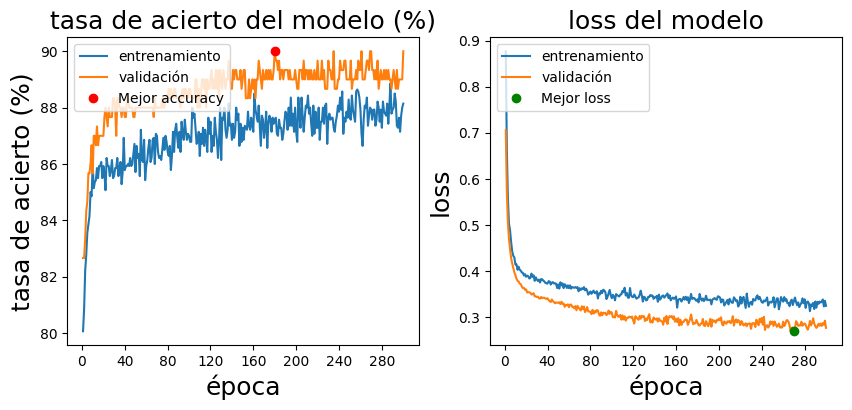

Epoch: 300/300
Training Accuracy: 0.8814
Validation Accuracy: 0.9000


In [ ]:

# Inicializar listas para seguimiento del rendimiento
serie_tr_acc = []
serie_val_acc = []
serie_tr_loss = []
serie_val_loss = []
modelpath = modelos_data_path + "best_model_9.keras"
early_stopping = EarlyStopping(monitor='val_loss',
                                patience=5,
                                mode='min')
# Definir el callback ModelCheckpoint para guardar el mejor modelo en un archivo temporal durante el entrenamiento
checkpoint = ModelCheckpoint(modelpath, monitor='val_loss', save_best_only=True, mode='min')

# Número de épocas
epochs = 300
for e in range(epochs):
    # Entrenar el modelo
    history = model.fit(X_train_scaled,
                        train_df_y_one_hot_array,
                        epochs=1,
                        batch_size=16,
                        validation_data=(X_val_scaled, val_df_y_one_hot_array),
                        verbose=1,
                        callbacks=[early_stopping, checkpoint])
    # Guardar métricas
    serie_tr_acc.append(history.history["accuracy"][0])
    serie_val_acc.append(history.history["val_accuracy"][0])
    serie_tr_loss.append(history.history["loss"][0])
    serie_val_loss.append(history.history["val_loss"][0])

    # Limpiar la salida y mostrar las gráficas
    clear_output(wait=True)
    grafica_entrenamiento(serie_tr_acc, serie_val_acc,
                          serie_tr_loss, serie_val_loss)
    print(f"Epoch: {e+1}/{epochs}")
    print(f"Training Accuracy: {serie_tr_acc[-1]:.4f}")
    print(f"Validation Accuracy: {serie_val_acc[-1]:.4f}")


### Resultados del modelo dnn

In [ ]:
#model = tf.keras.models.load_model(modelos_data_path + 'best_model_e9.keras')

In [ ]:
score_tr = model.evaluate(X_train_scaled, train_df_y_one_hot_array, verbose=0)
print('Train loss    :', score_tr[0])
print('Train accuracy:', score_tr[1])

score_val = model.evaluate(X_val_scaled, val_df_y_one_hot_array, verbose=0)
print('Val   loss    :', score_val[0])
print('Val   accuracy:', score_val[1])

score_test = model.evaluate(X_test_scaled, test_df_y_one_hot_array, verbose=0)
print('Test  loss    :', score_test[0])
print('Test  accuracy:', score_test[1])


Train loss    : 0.29064124822616577
Train accuracy: 0.8928571343421936
Val   loss    : 0.276729553937912
Val   accuracy: 0.8999999761581421
Test  loss    : 0.25614407658576965
Test  accuracy: 0.9100000262260437


### Definición de umbrales

#### Umbral manual

In [ ]:
umbral_decision_maligno = 0.2

In [ ]:
clases_test = test_df_y_one_hot_array.argmax(1) # clase real test
alarmas = 1*(model.predict(X_test_scaled)[:,1]>umbral_decision_maligno)
alarmas_prob = model.predict(X_test_scaled)[:,1]

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


In [ ]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(clases_test, alarmas)
cm


array([[216,  27],
       [  7,  50]])

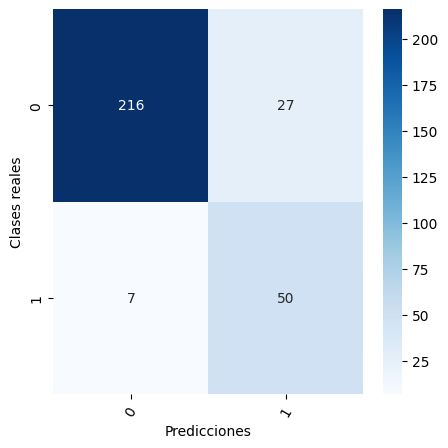

In [ ]:
# Grafica la matriz de confusión
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=True, yticklabels=True)
plt.xlabel('Predicciones')
plt.ylabel('Clases reales')
plt.xticks(rotation=60)
plt.show()

#### Umbral óptimo

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


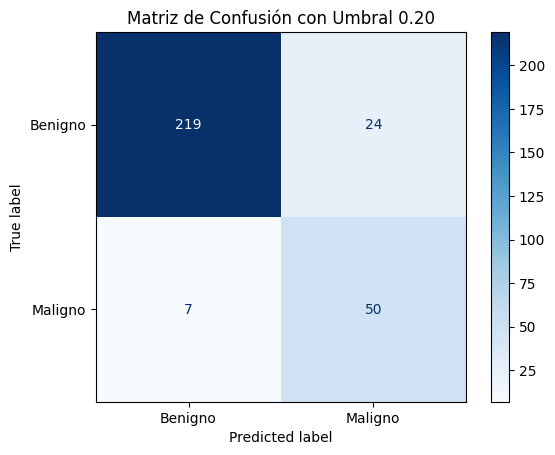

Mejor umbral: 0.20
Precisión de benignos: 0.90
Detección de malignos: 0.88


In [ ]:
umbral_optimo = optimizar_umbral(predictions_prob=model.predict(X_test_scaled),
                                 true_labels=test_df_y_one_hot_array.argmax(1),
                                 benigno_min_precision=0.9)

### Resumen de metricas


              precision    recall  f1-score   support

           0       0.97      0.89      0.93       243
           1       0.65      0.88      0.75        57

    accuracy                           0.89       300
   macro avg       0.81      0.88      0.84       300
weighted avg       0.91      0.89      0.89       300



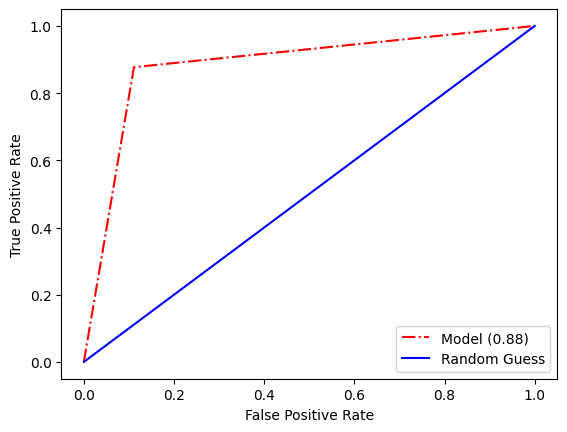

In [ ]:
from sklearn.metrics import classification_report, roc_curve, auc

print('')
print(classification_report(np.argmax(test_df_y_one_hot_array,1),
                            alarmas))

fpr, tpr, thresholds = roc_curve(np.argmax(test_df_y_one_hot_array, 1), alarmas)
fig, ax1 = plt.subplots(1,1)
ax1.plot(fpr, tpr, 'r-.', label = 'Model (%2.2f)' % auc(fpr, tpr))
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.plot(fpr, fpr, 'b-', label = 'Random Guess')
ax1.legend();

## Explicabilidad

In [ ]:
# Obtener los nombres de las características
numerical_feature_names = numerical_columns
categorical_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_columns)
feature_names = np.concatenate([numerical_feature_names, categorical_feature_names])

# Verifica la longitud de feature_names
print(len(feature_names))
print(X_val_scaled.shape[1])

41
41


/usr/local/lib/python3.10/dist-packages/shap/explainers/_deep/deep_tf.py:99: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn("Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.")


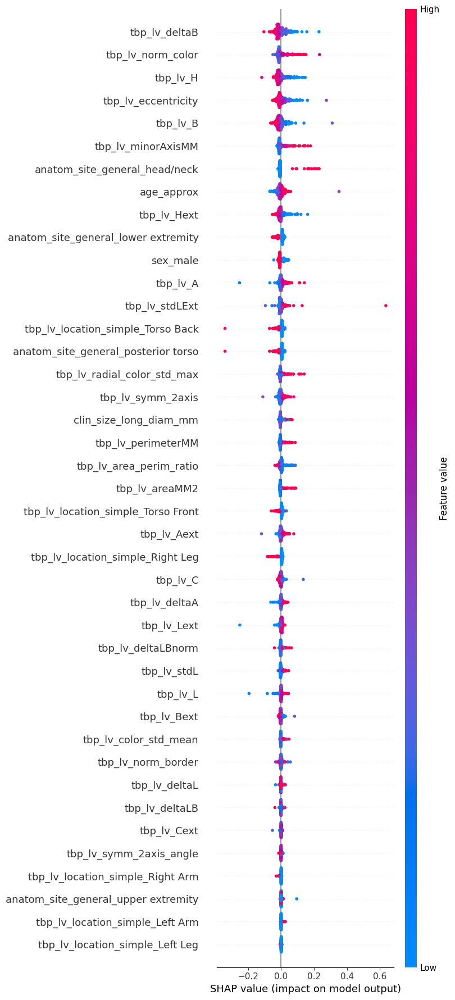

In [ ]:
import shap
import numpy as np

# Para reducir la cantidad de datos y acelerar SHAP, seleccionamos un subconjunto de X_train_scaled
background = X_train_scaled[np.random.choice(X_train_scaled.shape[0], 100, replace=False)]

# Crear el explicador SHAP para el modelo Keras
explainer = shap.DeepExplainer(model, background)

# Calcular los valores SHAP para un conjunto de datos de prueba
shap_values = explainer.shap_values(X_val_scaled)

# Seleccionar los valores SHAP para la clase 1 (maligno)
shap_values_class_1 = shap_values[..., 1]

# Visualizar el SHAP summary plot para la clase 1
shap.summary_plot(shap_values_class_1, X_val_scaled, feature_names=feature_names, max_display=44)



# Modelo solo variables de datos físicos con CTGAN

### CTGAN ampliación de datos solo cáncer

Para el modelo que hace uso de ctgan partimos del conjunto de datos limpio, no de los subconjuntos, para amplificar antes de seleccionar

In [ ]:
data_ctgan = data.drop(['isic_id'], axis=1)

In [ ]:
from ctgan import CTGAN

In [ ]:
# Inicializar el modelo CTGAN
ctgan = CTGAN(verbose=True)
malignant_data  = data_ctgan[data_ctgan['target'] == 'maligno']

# Lista de características categóricas
categorical_features = ['target', 'patient_id', 'sex', 'anatom_site_general',
       'tbp_lv_location', 'tbp_lv_location_simple']

# Entrenar el modelo CTGAN solo con las muestras malignas
ctgan.fit(malignant_data, categorical_features, epochs=1500)

# Generar datos sintéticos solo para las muestras malignas
n_samples = len(malignant_data) * 2
synthetic_data_malignant = ctgan.sample(n_samples)

# Mostrar las primeras filas de los datos sintéticos generados
print(synthetic_data_malignant.head())

# Unir los datos sintéticos malignos con los datos originales
amplified_data = pd.concat([malignant_data, synthetic_data_malignant], ignore_index=True)

Gen. (-1.87) | Discrim. (-0.04): 100%|██████████| 1500/1500 [08:31<00:00,  2.93it/s]


    target  patient_id  age_approx     sex anatom_site_general  \
0  maligno  IP_2725676   49.489783  female     posterior torso   
1  maligno  IP_5709986   46.752091    male      anterior torso   
2  maligno  IP_7259384   37.540555    male           head/neck   
3  maligno  IP_5529572   80.653960    male     upper extremity   
4  maligno  IP_7346729   65.414347    male     lower extremity   

   clin_size_long_diam_mm   tbp_lv_A  tbp_lv_Aext   tbp_lv_B  tbp_lv_Bext  \
0                5.546043  26.986979    17.904712   1.829541    24.876465   
1                7.543941  12.421950    17.633070  27.263216    20.877171   
2                3.692563  18.825308    16.868135  13.858078    18.160614   
3                1.998690  15.924732    25.861188   2.512615    14.069797   
4                2.555116  10.722395     9.335677   9.927904    14.689420   

   ...  tbp_lv_minorAxisMM  tbp_lv_norm_border  tbp_lv_norm_color  \
0  ...            0.586983            1.318142           4.506491   
1 

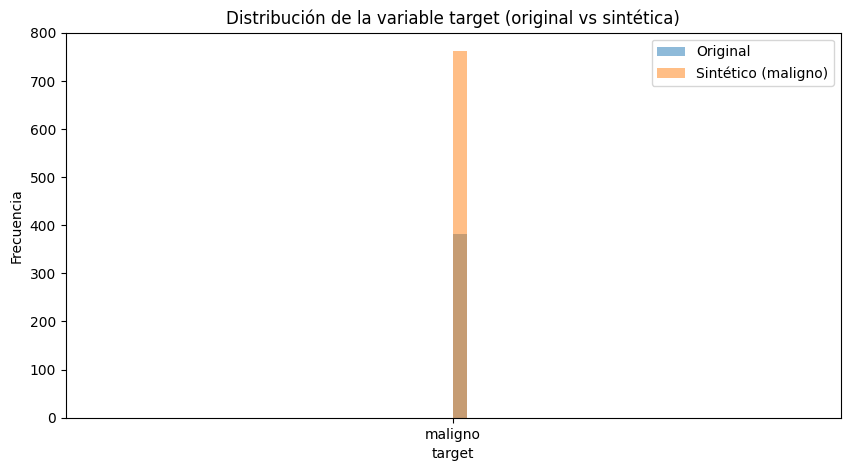

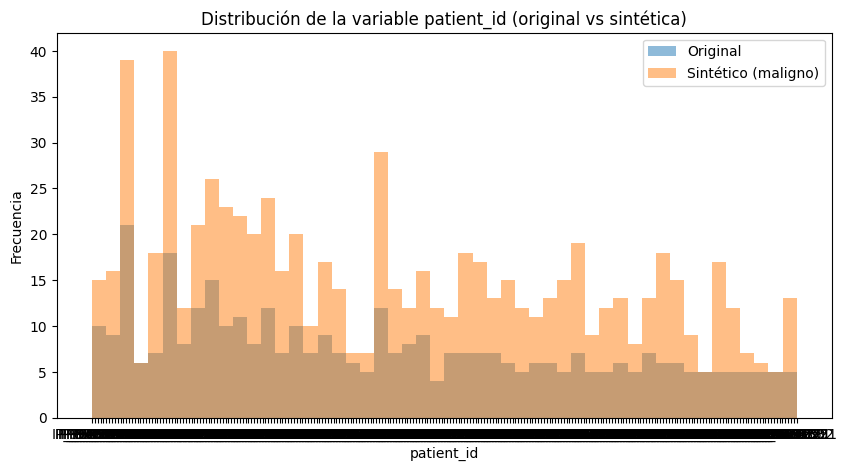

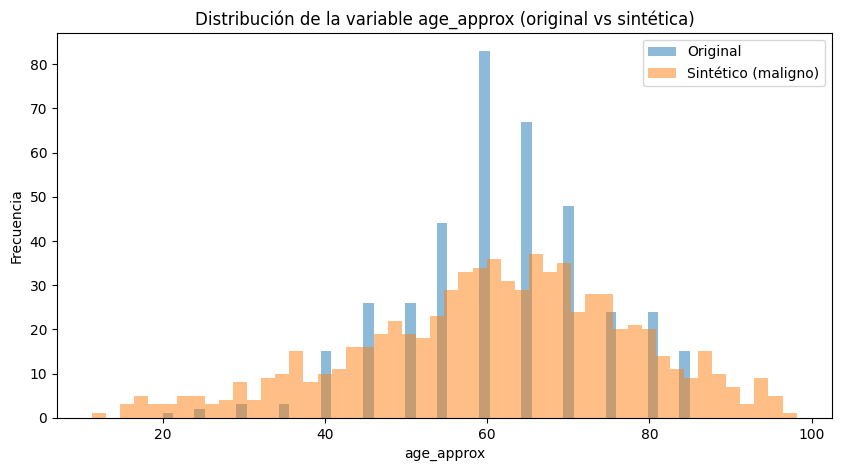

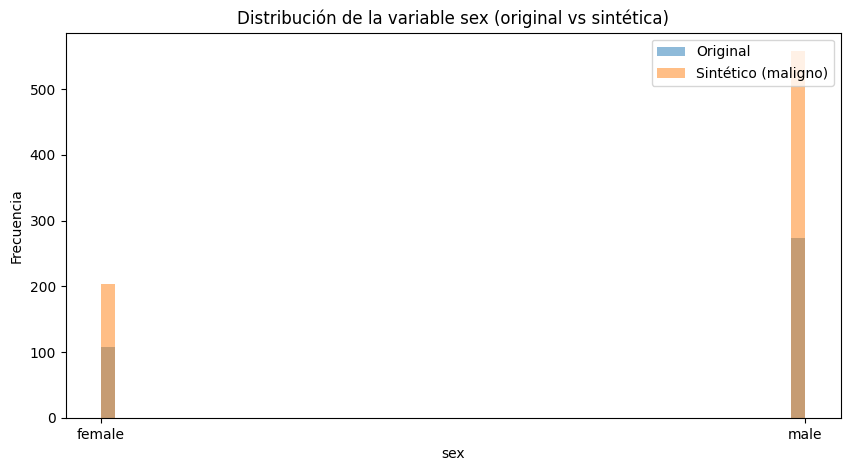

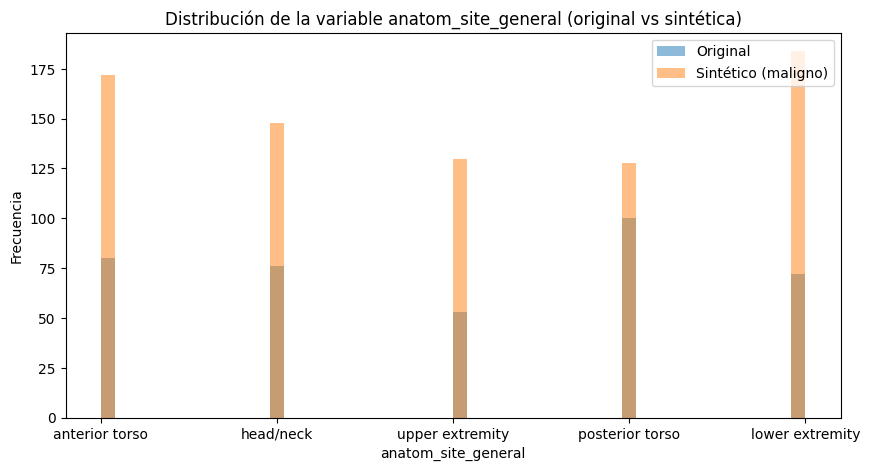

...

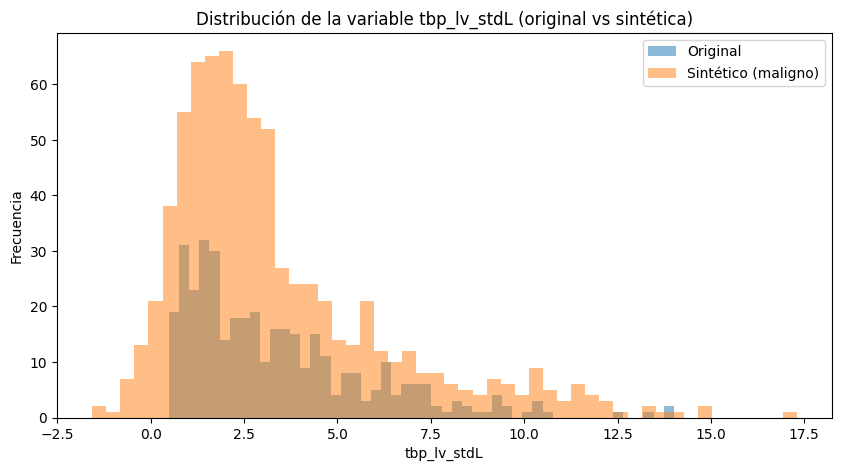

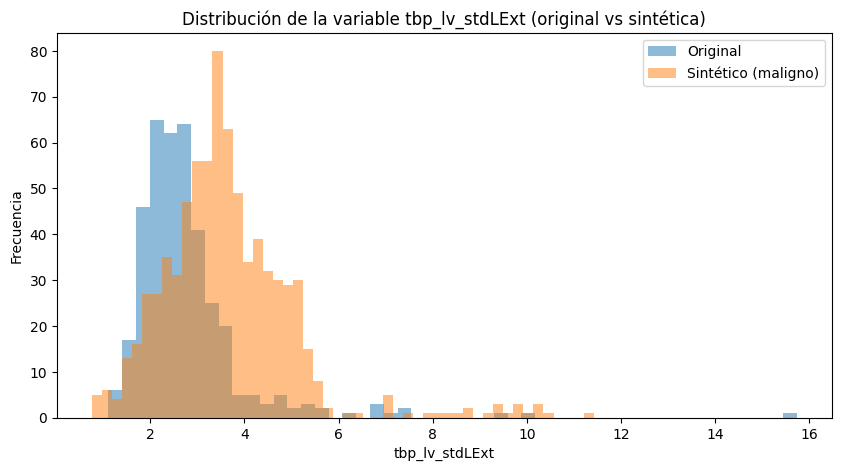

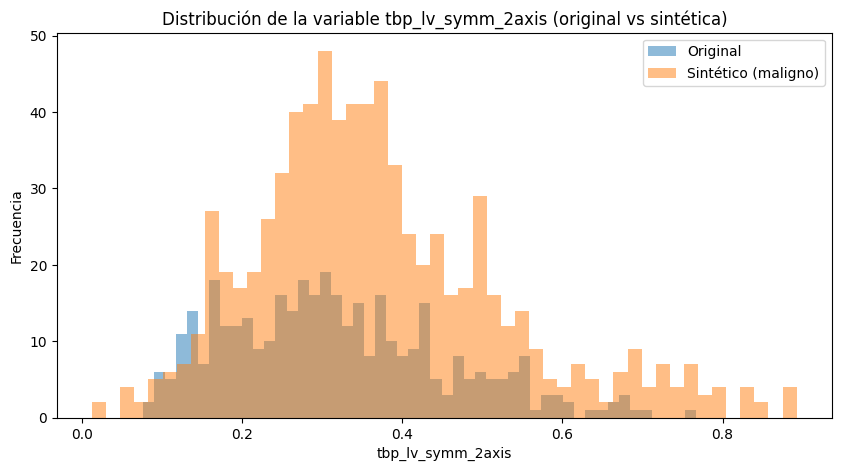

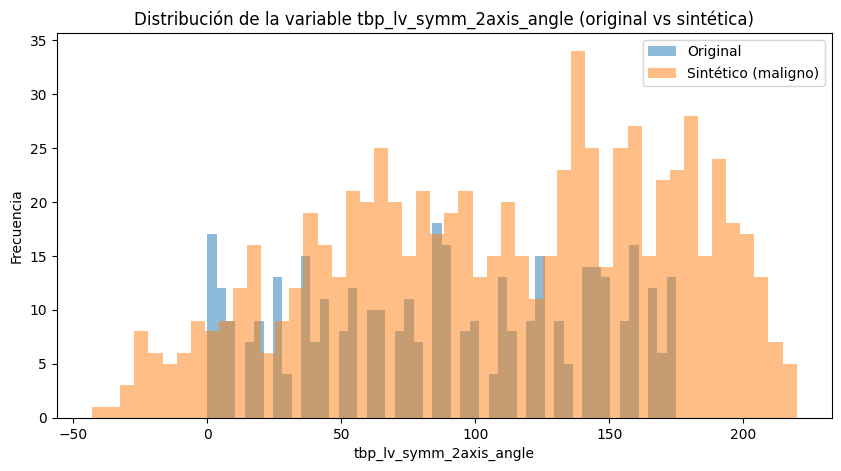

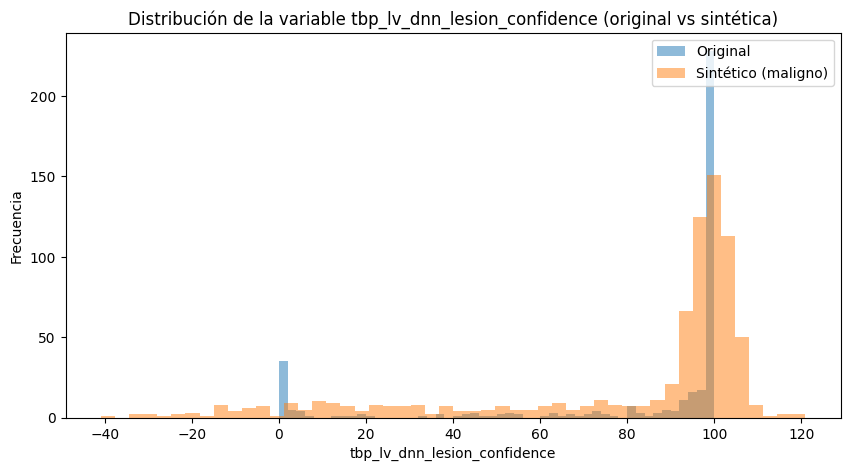

In [ ]:
# Comparar la distribución de las variables originales vs sintéticas (ejemplo para todas las variables)
for variable in data_ctgan.columns:
    plt.figure(figsize=(10, 5))
    plt.hist(malignant_data[variable], bins=50, alpha=0.5, label='Original')
    plt.hist(synthetic_data_malignant[variable], bins=50, alpha=0.5, label='Sintético (maligno)')
    plt.legend(loc='upper right')
    plt.xlabel(variable)
    plt.ylabel('Frecuencia')
    plt.title(f'Distribución de la variable {variable} (original vs sintética)')
    plt.show()


(381914, 37) (762, 37)


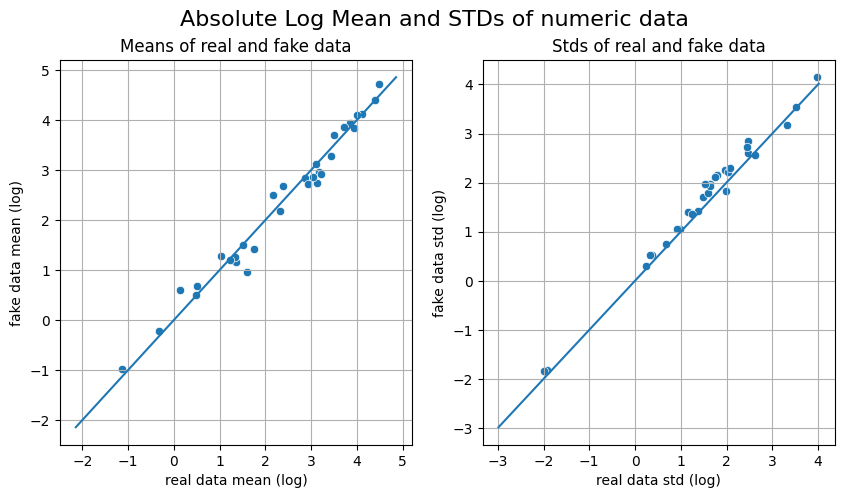

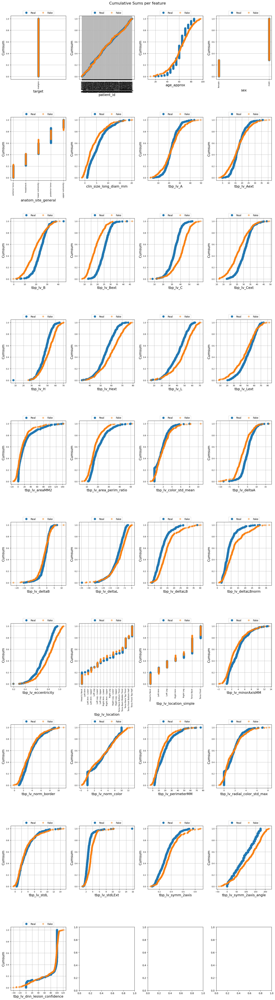

/usr/local/lib/python3.10/dist-packages/table_evaluator/table_evaluator.py:246: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation="vertical")
/usr/local/lib/python3.10/dist-packages/table_evaluator/table_evaluator.py:246: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation="vertical")
/usr/local/lib/python3.10/dist-packages/table_evaluator/table_evaluator.py:246: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation="vertical")
/usr/local/lib/python3.10/dist-packages/table_evaluator/table_evaluator.py:246: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(axes[i].get_xticklabels(), rotation="vertical")
/usr/local/lib/python3.10/dist-packages/table_evaluator/table_evaluator.py:246: UserWarning: FixedFormat

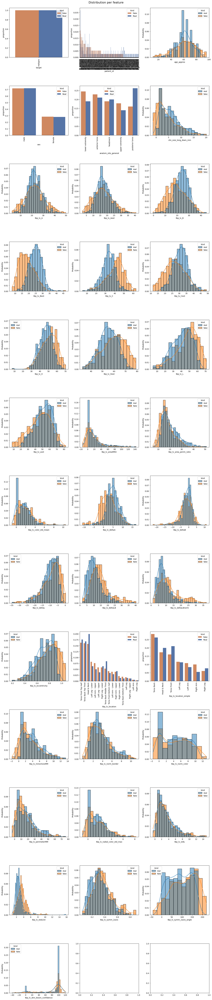

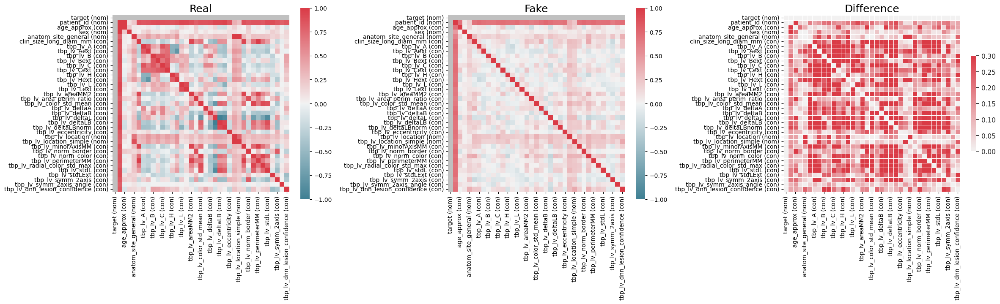

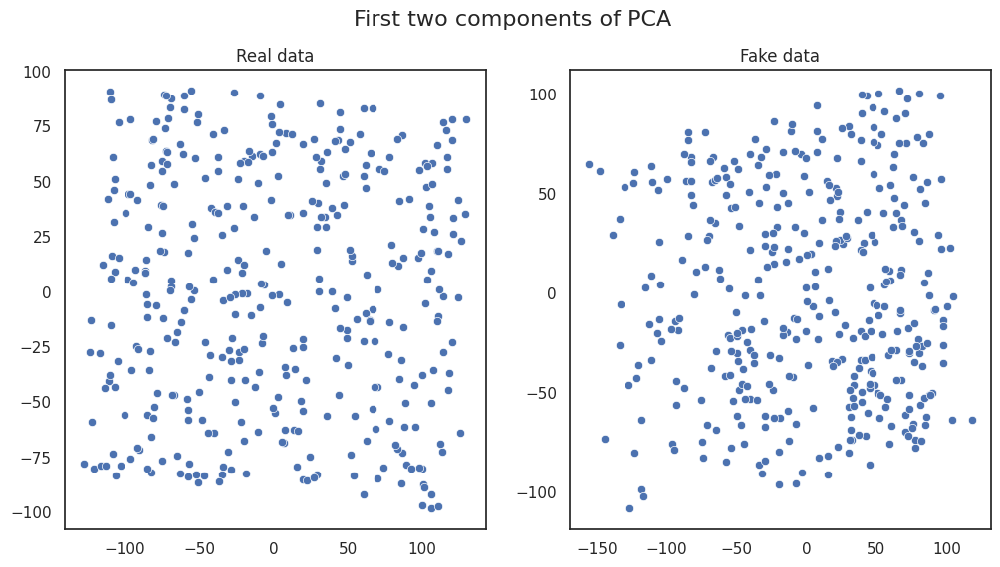

In [ ]:
from table_evaluator import TableEvaluator

print(data_ctgan.shape, synthetic_data_malignant.shape)
table_evaluator =  TableEvaluator(malignant_data, synthetic_data_malignant, cat_cols= categorical_features)

table_evaluator.visual_evaluation()

#### Selección

In [ ]:
# synthetic_data_malignant.to_csv(base_path + 'datos_sinteticos_malignant.csv', index=False)
synthetic_data_malignant = pd.read_csv(base_path + 'datos_sinteticos_malignant.csv')

In [ ]:
ids =synthetic_data_malignant['patient_id'].unique()

In [ ]:
ids_real = data_ctgan[data_ctgan['target'] == 'maligno']['patient_id'].unique()

In [ ]:
dif = list(set(ids_real) - set(ids))
len(dif)

26

In [ ]:
datactgan = pd.concat([data_ctgan, synthetic_data_malignant], axis=0)

In [ ]:
# Paso 1: Filtrar todas las filas donde 'target' es 1 y 0 por separado
data_target_1_ctgan = datactgan[datactgan['target'] == 'maligno']
data_target_0_ctgan = datactgan[datactgan['target'] == 'benigno']

In [ ]:
from sklearn.model_selection import train_test_split
# Paso 2: Hago split del target 1 de los pacientes para tener tres conjuntos con target 1 y 0 ya que los pacientes de target 1 tambien tienen muestras con target 0 como hemos visto

# Obtener los patient_id únicos
unique_patients_ctgan = data_target_1_ctgan['patient_id'].unique()

# Usar train_test_split en los patient_id únicos
train_patients_ctgan, ttemp_patients_ctgan = train_test_split(unique_patients_ctgan, test_size=0.3, random_state=0)
val_patients_ctgan, test_patients_ctgan = train_test_split(ttemp_patients_ctgan, test_size=0.5, random_state=0)

In [ ]:
len(train_patients_ctgan), len(val_patients_ctgan), len(test_patients_ctgan)

(174, 37, 38)

In [ ]:
# Paso 3: Hacer split con los pacientes que solo tienen muestras en target 0 (eliminando los pacientes que ya hemos repartido)
# Obtener los patient_id únicos
unique_patients_0_1_ctgan = data_target_0_ctgan['patient_id'].unique()
# Usar sets para eliminar los elementos
unique_patients_0_ctgan = list(set(unique_patients_0_1_ctgan) - set(unique_patients_ctgan))

# Usar train_test_split en los patient_id únicos
train_patients_0_ctgan, ttemp_patients_0_ctgan = train_test_split(unique_patients_0_ctgan, test_size=0.3, random_state=0)
val_patients_0_ctgan, test_patients_0_ctgan = train_test_split(ttemp_patients_0_ctgan, test_size=0.5, random_state=0)

In [ ]:
len(train_patients_0_ctgan), len(val_patients_0_ctgan), len(test_patients_0_ctgan)

(518, 111, 111)

In [ ]:
# Paso 4: creo los conjuntos de datos con data a partir de los pacientes para cada tipo
train_df_0_ctgan = datactgan[datactgan['patient_id'].isin(train_patients_0_ctgan)]
val_df_0_ctgan = datactgan[datactgan['patient_id'].isin(val_patients_0_ctgan)]
test_df_0_ctgan = datactgan[datactgan['patient_id'].isin(test_patients_0_ctgan)]
train_df_0_ctgan.shape, val_df_0_ctgan.shape, test_df_0_ctgan.shape

((151360, 37), (39298, 37), (41059, 37))

In [ ]:
train_df_0_1_ctgan = datactgan[datactgan['patient_id'].isin(train_patients_ctgan)]
val_df_0_1_ctgan = datactgan[datactgan['patient_id'].isin(val_patients_ctgan)]
test_df_0_1_ctgan = datactgan[datactgan['patient_id'].isin(test_patients_ctgan)]
train_df_0_1_ctgan.shape, val_df_0_1_ctgan.shape, test_df_0_1_ctgan.shape

((95903, 37), (17783, 37), (37273, 37))

In [ ]:
# 0.7   0.15   0.15
# Obtener muestras de entrenamiento, validación y prueba
train_df_0_1_custom_ctgan = obtener_muestras(train_df_0_1_ctgan, 700)
val_df_0_1_custom_ctgan = obtener_muestras(val_df_0_1_ctgan, 150)
test_df_0_1_custom_ctgan = obtener_muestras(test_df_0_1_ctgan, 150)
# Coger del df de target 0 y 1 en 700 150 y 150 teniendo en cuenta que tenemos que coger todas las muestras de cancer
# Seleccionar muestras adicionales aleatorias de target != 1
train_df_0_custom_ctgan = train_df_0_ctgan.sample(n=700, random_state=0)
val_df_0_custom_ctgan = val_df_0_ctgan.sample(n=150, random_state=0)
test_df_0_custom_ctgan = test_df_0_ctgan.sample(n=150, random_state=0)

In [ ]:
train_df_0_1_custom_ctgan.shape, val_df_0_1_custom_ctgan.shape, test_df_0_1_custom_ctgan.shape, train_df_0_custom_ctgan.shape, val_df_0_custom_ctgan.shape, test_df_0_custom_ctgan.shape

((700, 37), (150, 37), (150, 37), (700, 37), (150, 37), (150, 37))

In [ ]:
train_df_ctgan = pd.concat([train_df_0_1_custom_ctgan, train_df_0_custom_ctgan], axis=0)
val_df_ctgan = pd.concat([val_df_0_1_custom_ctgan, val_df_0_custom_ctgan], axis=0)
test_df_ctgan = pd.concat([test_df_0_1_custom_ctgan, test_df_0_custom_ctgan], axis=0)
train_df_ctgan.shape, val_df_ctgan.shape, test_df_ctgan.shape

((1400, 37), (300, 37), (300, 37))

In [ ]:
# Asegurarse de que el resultado esté barajado
train_df_ctgan = shuffle(train_df_ctgan, random_state=0)
val_df_ctgan = shuffle(val_df_ctgan, random_state=0)
test_df_ctgan = shuffle(test_df_ctgan, random_state=0)

In [ ]:
# train_df_ctgan.to_csv(base_path + 'seleccion_2000/train_df_ctgan.csv', index=False)
# val_df_ctgan.to_csv(base_path + 'seleccion_2000/val_df_ctgan.csv', index=False)
# test_df_ctgan.to_csv(base_path + 'seleccion_2000/test_df_ctgan.csv', index=False)

## OnehotEncoder para las varaibles categoricas

In [ ]:
train_df_ctgan = pd.read_csv(base_path + 'seleccion_2000/train_df_ctgan.csv')
val_df_ctgan = pd.read_csv(base_path + 'seleccion_2000/val_df_ctgan.csv')
test_df_ctgan = pd.read_csv(base_path + 'seleccion_2000/test_df_ctgan.csv')

In [ ]:
train_df_msv_ctgan = train_df_ctgan.drop(['patient_id', 'tbp_lv_dnn_lesion_confidence'], axis=1)
val_df_msv_ctgan = val_df_ctgan.drop(['patient_id', 'tbp_lv_dnn_lesion_confidence'], axis=1)
test_df_msv_ctgan = test_df_ctgan.drop(['patient_id', 'tbp_lv_dnn_lesion_confidence'], axis=1)

In [ ]:
# Definir características (features) y etiquetas (labels)
train_df_X_ctgan = train_df_msv_ctgan.drop(columns=['target'])  # Eliminar columnas que no son características relevantes
train_df_y_ctgan = train_df_msv_ctgan['target']

val_df_X_ctgan = val_df_msv_ctgan.drop(columns=['target'])
val_df_y_ctgan = val_df_msv_ctgan['target']

test_df_X_ctgan = test_df_msv_ctgan.drop(columns=['target'])
test_df_y_ctgan = test_df_msv_ctgan['target']

In [ ]:
train_df_X_ctgan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1400 entries, 360937 to 105
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   age_approx                   1400 non-null   float64
 1   sex                          1400 non-null   object 
 2   anatom_site_general          1400 non-null   object 
 3   clin_size_long_diam_mm       1400 non-null   float64
 4   tbp_lv_A                     1400 non-null   float64
 5   tbp_lv_Aext                  1400 non-null   float64
 6   tbp_lv_B                     1400 non-null   float64
 7   tbp_lv_Bext                  1400 non-null   float64
 8   tbp_lv_C                     1400 non-null   float64
 9   tbp_lv_Cext                  1400 non-null   float64
 10  tbp_lv_H                     1400 non-null   float64
 11  tbp_lv_Hext                  1400 non-null   float64
 12  tbp_lv_L                     1400 non-null   float64
 13  tbp_lv_Lext        

In [ ]:
columns_other = ['age_approx','sex','anatom_site_general','clin_size_long_diam_mm',
 'tbp_lv_A','tbp_lv_Aext','tbp_lv_B','tbp_lv_Bext','tbp_lv_C','tbp_lv_Cext','tbp_lv_H','tbp_lv_Hext',
 'tbp_lv_L','tbp_lv_Lext','tbp_lv_areaMM2','tbp_lv_area_perim_ratio','tbp_lv_color_std_mean','tbp_lv_deltaA',
 'tbp_lv_deltaB','tbp_lv_deltaL','tbp_lv_deltaLB','tbp_lv_deltaLBnorm','tbp_lv_eccentricity',
 'tbp_lv_location_simple','tbp_lv_minorAxisMM','tbp_lv_norm_border','tbp_lv_norm_color','tbp_lv_perimeterMM',
 'tbp_lv_radial_color_std_max','tbp_lv_stdL','tbp_lv_stdLExt','tbp_lv_symm_2axis','tbp_lv_symm_2axis_angle']

In [ ]:
## Normalización con MinMax()
# Seleccionar las columnas categóricas y numéricas
categorical_columns = ['sex', 'anatom_site_general',  'tbp_lv_location_simple']
numerical_columns = [col for col in columns_other if col not in categorical_columns]

In [ ]:
train_df_X_ctgan['anatom_site_general'].unique(), val_df_X_ctgan['anatom_site_general'].unique(), test_df_X_ctgan['anatom_site_general'].unique()

(array(['posterior torso', 'lower extremity', 'anterior torso',
        'upper extremity', 'head/neck'], dtype=object),
 array(['lower extremity', 'posterior torso', 'upper extremity',
        'anterior torso', 'head/neck'], dtype=object),
 array(['lower extremity', 'head/neck', 'anterior torso',
        'posterior torso', 'upper extremity'], dtype=object))

In [ ]:
# Definir el pipeline para las columnas numéricas
numerical_scaler = MinMaxScaler()

# Definir el pipeline para las columnas categóricas
categorical_scaler = OneHotEncoder(drop='first', sparse_output=False)

# Combinar ambos en un ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_scaler, numerical_columns),
        ('cat', categorical_scaler, categorical_columns)
    ]
)

In [ ]:
# Ajustar y transformar el conjunto de entrenamiento
X_train_scaled_ctgan = preprocessor.fit_transform(train_df_X_ctgan)

# Transformar el conjunto de validación y prueba usando el preprocesador ya ajustado
X_val_scaled_ctgan = preprocessor.transform(val_df_X_ctgan)
X_test_scaled_ctgan = preprocessor.transform(test_df_X_ctgan)

In [ ]:
train_df_y_ctgan.unique(), val_df_y_ctgan.unique(), test_df_y_ctgan.unique()

(array(['benigno', 'maligno'], dtype=object),
 array(['benigno', 'maligno'], dtype=object),
 array(['benigno', 'maligno'], dtype=object))

In [ ]:
#Pasamos de una columna como etiqueta a dos columnas para saber el porcentaje de cada una que da el modelo

# Convertir a formato one-hot encoding
train_df_y_one_hot_ctgan = pd.get_dummies(train_df_y_ctgan)
val_df_y_one_hot_ctgan = pd.get_dummies(val_df_y_ctgan)
test_df_y_one_hot_ctgan = pd.get_dummies(test_df_y_ctgan)

train_df_y_one_hot_ctgan.shape, val_df_y_one_hot_ctgan.shape, test_df_y_one_hot_ctgan.shape

((1400, 2), (300, 2), (300, 2))

In [ ]:
# Convertir a numpy array de tipo float32
train_df_y_one_hot_array_ctgan = train_df_y_one_hot_ctgan.to_numpy().astype('float32')
val_df_y_one_hot_array_ctgan = val_df_y_one_hot_ctgan.to_numpy().astype('float32')
test_df_y_one_hot_array_ctgan = test_df_y_one_hot_ctgan.to_numpy().astype('float32')
train_df_y_one_hot_array_ctgan.shape, val_df_y_one_hot_array_ctgan.shape, test_df_y_one_hot_array_ctgan.shape

((1400, 2), (300, 2), (300, 2))

In [ ]:
train_df_y_one_hot_array_ctgan

array([[1., 0.],
       [0., 1.],
       [1., 0.],
       ...,
       [1., 0.],
       [0., 1.],
       [0., 1.]], dtype=float32)

## Modelo

### Definición del modelo

In [ ]:
X_train_scaled_ctgan.shape, X_val_scaled_ctgan.shape, X_test_scaled_ctgan.shape, train_df_y_ctgan.shape, val_df_y_ctgan.shape, test_df_y_ctgan.shape

((1400, 57), (300, 57), (300, 57), (1400,), (300,), (300,))

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from datetime import datetime

# Definir una red neuronal
model = Sequential([
    Dense(32, input_shape=(X_train_scaled_ctgan.shape[1],), activation='relu'),
    Dropout(0.4),
    Dense(2, activation='softmax')  # Capa de salida para clasificación binaria
])

# Compilar el modelo con categorical_crossentropy para problemas de clasificación
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])


# Mostrar resumen del modelo
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                      │ (None, 32)                  │           1,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 2)                   │              66 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,922 (7.51 KB)

 Trainable params: 1,922 (7.51 KB)

 Non-trainable params: 0 (0.00 B)

### Entrenamiento del modelo

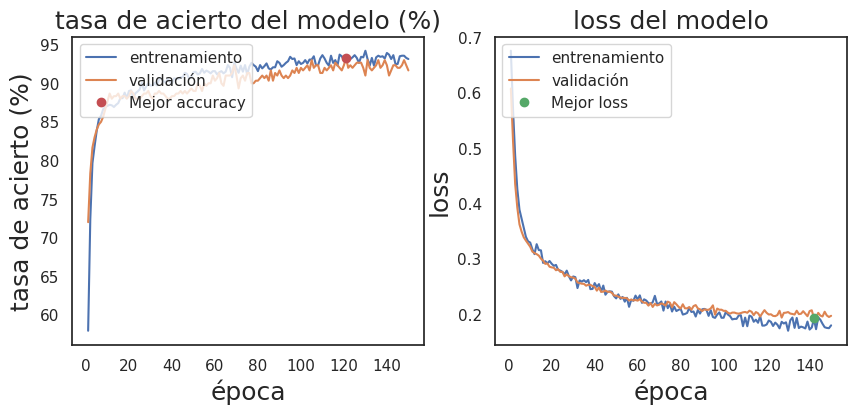

Epoch: 150/150
Training Accuracy: 0.9314
Validation Accuracy: 0.9167


In [ ]:

# Inicializar listas para seguimiento del rendimiento
serie_tr_acc = []
serie_val_acc = []
serie_tr_loss = []
serie_val_loss = []
date_str = datetime.now().strftime("%Y%m%d_%H%M%S")
modelpath = modelos_data_path + "best_model_10_ctgan.keras"
early_stopping = EarlyStopping(monitor='val_loss',
                                patience=5,
                                mode='min')
# Definir el callback ModelCheckpoint para guardar el mejor modelo en un archivo temporal durante el entrenamiento
checkpoint = ModelCheckpoint(modelpath, monitor='val_loss', save_best_only=True, mode='min')

# Número de épocas
epochs = 150
for e in range(epochs):
    # Entrenar el modelo
    history = model.fit(X_train_scaled_ctgan,
                        train_df_y_one_hot_array_ctgan,
                        epochs=1,
                        batch_size=16,
                        validation_data=(X_val_scaled_ctgan, val_df_y_one_hot_array_ctgan),
                        verbose=1,
                        callbacks=[early_stopping, checkpoint])
    # Guardar métricas
    serie_tr_acc.append(history.history["accuracy"][0])
    serie_val_acc.append(history.history["val_accuracy"][0])
    serie_tr_loss.append(history.history["loss"][0])
    serie_val_loss.append(history.history["val_loss"][0])

    # Limpiar la salida y mostrar las gráficas
    clear_output(wait=True)
    grafica_entrenamiento(serie_tr_acc, serie_val_acc,
                          serie_tr_loss, serie_val_loss)
    print(f"Epoch: {e+1}/{epochs}")
    print(f"Training Accuracy: {serie_tr_acc[-1]:.4f}")
    print(f"Validation Accuracy: {serie_val_acc[-1]:.4f}")


### Resultados del modelo dnn

In [ ]:
#model = tf.keras.models.load_model(modelos_data_path + 'best_model_10_ctgan.keras')

In [ ]:
score_tr = model.evaluate(X_train_scaled_ctgan, train_df_y_one_hot_array_ctgan, verbose=0)
print('Train loss    :', score_tr[0])
print('Train accuracy:', score_tr[1])

score_val = model.evaluate(X_val_scaled_ctgan, val_df_y_one_hot_array_ctgan, verbose=0)
print('Val   loss    :', score_val[0])
print('Val   accuracy:', score_val[1])

score_test = model.evaluate(X_test_scaled_ctgan, test_df_y_one_hot_array_ctgan, verbose=0)
print('Test  loss    :', score_test[0])
print('Test  accuracy:', score_test[1])


Train loss    : 0.14066949486732483
Train accuracy: 0.9492856860160828
Val   loss    : 0.19680006802082062
Val   accuracy: 0.9166666865348816
Test  loss    : 0.16893549263477325
Test  accuracy: 0.9366666674613953


### Definición de umbrales

In [ ]:
umbral_decision_maligno = 0.2

In [ ]:
clases_test = test_df_y_one_hot_array_ctgan.argmax(1) # clase real test
alarmas = 1*(model.predict(X_test_scaled_ctgan)[:,1]>umbral_decision_maligno)
alarmas_prob = model.predict(X_test_scaled_ctgan)[:,1]

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


In [ ]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(clases_test, alarmas)
cm


array([[131,  19],
       [  5, 145]])

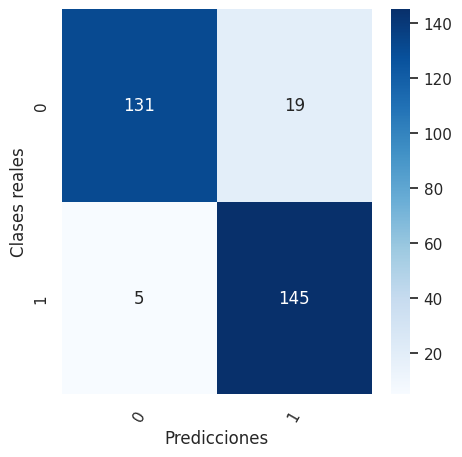

In [ ]:
# Grafica la matriz de confusión
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=True, yticklabels=True)
plt.xlabel('Predicciones')
plt.ylabel('Clases reales')
plt.xticks(rotation=60)
plt.show()


              precision    recall  f1-score   support

           0       0.96      0.87      0.92       150
           1       0.88      0.97      0.92       150

    accuracy                           0.92       300
   macro avg       0.92      0.92      0.92       300
weighted avg       0.92      0.92      0.92       300



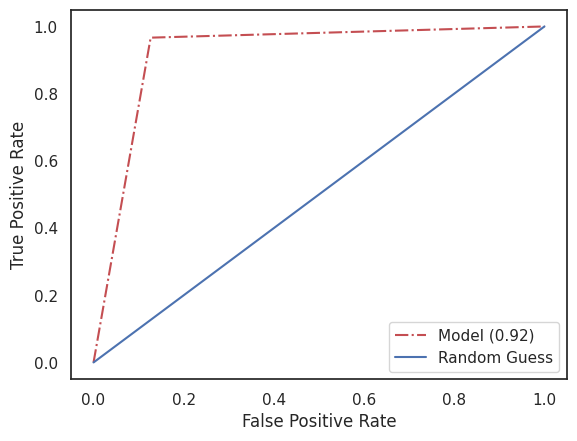

In [ ]:
from sklearn.metrics import classification_report, roc_curve, auc

print('')
print(classification_report(np.argmax(test_df_y_one_hot_array_ctgan,1),
                            alarmas))

fpr, tpr, thresholds = roc_curve(np.argmax(test_df_y_one_hot_array_ctgan, 1), alarmas)
fig, ax1 = plt.subplots(1,1)
ax1.plot(fpr, tpr, 'r-.', label = 'Model (%2.2f)' % auc(fpr, tpr))
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.plot(fpr, fpr, 'b-', label = 'Random Guess')
ax1.legend();

## Explicabilidad

In [ ]:
# Obtener los nombres de las características
numerical_feature_names = numerical_columns
categorical_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_columns)
feature_names = np.concatenate([numerical_feature_names, categorical_feature_names])

# Verifica la longitud de feature_names
print(len(feature_names))
print(X_train_scaled_ctgan.shape[1])

41
41


/usr/local/lib/python3.10/dist-packages/shap/explainers/_deep/deep_tf.py:99: UserWarning: Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.
  warnings.warn("Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode and some static graphs may not be supported. See PR #1483 for discussion.")


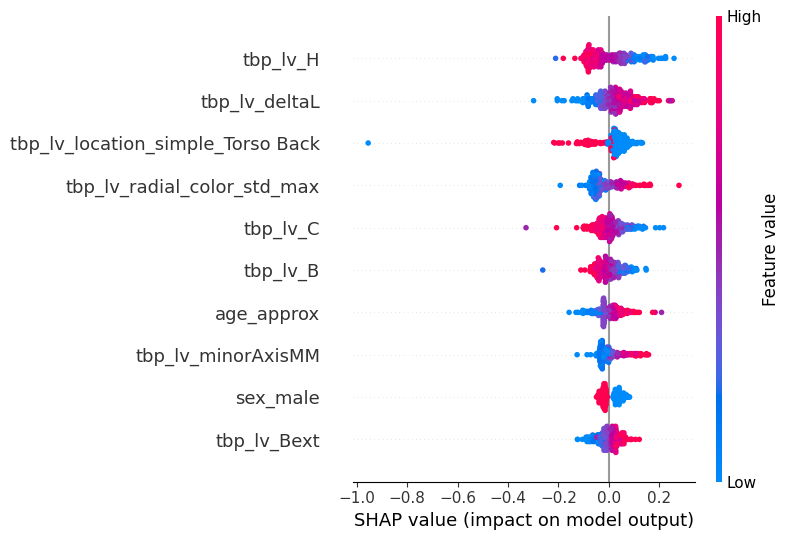

In [ ]:
import shap
import numpy as np

# Para reducir la cantidad de datos y acelerar SHAP, seleccionamos un subconjunto de X_train_scaled
background = X_train_scaled_ctgan[np.random.choice(X_train_scaled_ctgan.shape[0], 100, replace=False)]

# Crear el explicador SHAP para el modelo Keras
explainer = shap.DeepExplainer(model, background)

# Calcular los valores SHAP para un conjunto de datos de prueba
shap_values = explainer.shap_values(X_val_scaled_ctgan)

# Seleccionar los valores SHAP para la clase 1 (maligno)
shap_values_class_1 = shap_values[..., 1]

# Visualizar el SHAP summary plot para la clase 1
shap.summary_plot(shap_values_class_1, X_val_scaled_ctgan, feature_names=feature_names, max_display=10)



CArga del un modelo con ctgan y ejecucion de la explicabilidad

# Modelo solo de Imágenes

In [ ]:
train_df = pd.read_csv(base_path + 'seleccion_2000/train_df.csv')
val_df = pd.read_csv(base_path + 'seleccion_2000/val_df.csv')
test_df = pd.read_csv(base_path + 'seleccion_2000/test_df.csv')

## descomprimir solo las imágenes de los datos seleccionados

El archivo que contiene las imágenes es un zip. Vamos a descomprimir solo las imágenes que han sido seleccionadas en el conjunto de 2000 muestras.

In [ ]:
# Creamos lista de con los ids de la selección (train, val y test)
lista_ids = pd.concat([train_df['isic_id'], val_df['isic_id'], test_df['isic_id']])

# le añadimos el formato "image/{nombre}.jpg" para que puedan ser descomprimidas
lista_archivos_seleccionados = [f"image/{nombre}.jpg" for nombre in lista_ids]

In [ ]:
len(lista_archivos_seleccionados) # confirmar que es correcto, verificando el tamaño

2000

Debido a que la carpeta con las imágenes es demasiado pesada aun en el formato comprimido (1GB aprox) es necesario si se quiere ejecutar esta celda descargar las imagenes desde kaggle: https://www.kaggle.com/competitions/isic-2024-challenge/data

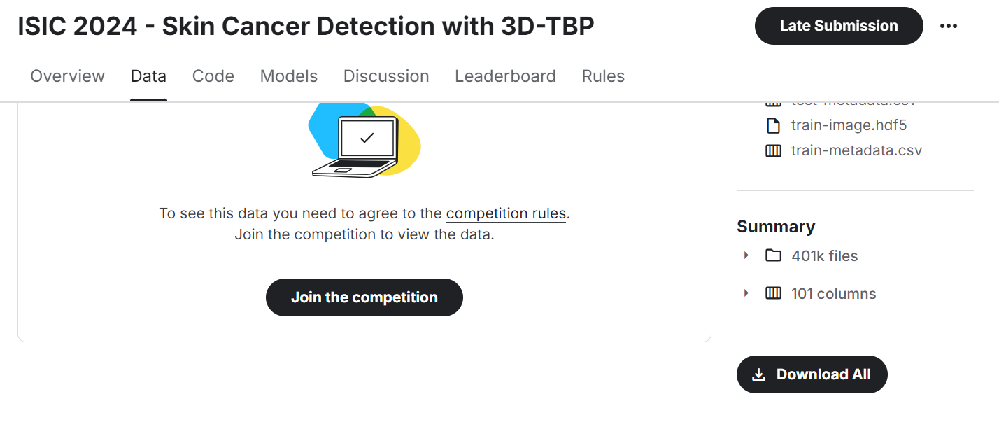

In [ ]:
# usamos la función: extraer_archivos_especificos
# argumentos de entrada de la función
zip_path = base_path + 'image.zip' # ruta del zip
carpeta_destino = base_path + 'image_data_selected/' # ruta de destino para gurdar las imágenes

# extraer_archivos_especificos(zip_path, lista_archivos_seleccionados, carpeta_destino)

Archivo extraído: image/ISIC_0601943.jpg
Archivo extraído: image/ISIC_4624449.jpg
Archivo extraído: image/ISIC_1552523.jpg
Archivo extraído: image/ISIC_1231650.jpg
Archivo extraído: image/ISIC_8694166.jpg
Archivo extraído: image/ISIC_5810570.jpg
Archivo extraído: image/ISIC_2438008.jpg
Archivo extraído: image/ISIC_6620020.jpg
Archivo extraído: image/ISIC_5573072.jpg
Archivo extraído: image/ISIC_2679300.jpg
Archivo extraído: image/ISIC_7307297.jpg
Archivo extraído: image/ISIC_6196744.jpg
Archivo extraído: image/ISIC_5221028.jpg
Archivo extraído: image/ISIC_4652850.jpg
Archivo extraído: image/ISIC_0969614.jpg
Archivo extraído: image/ISIC_7583570.jpg
Archivo extraído: image/ISIC_0979665.jpg
Archivo extraído: image/ISIC_7619731.jpg
Archivo extraído: image/ISIC_3657856.jpg
Archivo extraído: image/ISIC_2472694.jpg
Archivo extraído: image/ISIC_0596886.jpg
Archivo extraído: image/ISIC_0830592.jpg
Archivo extraído: image/ISIC_5941468.jpg
Archivo extraído: image/ISIC_7836717.jpg
Archivo extraído

Añadir el enlace a las imagenes en una columna: path_image

In [ ]:
# Definir la ruta base con la carpeta donde se han descomprimido las imagenes
base_path = base_path + 'image_data_selected/image/'

# Creamos la variable path_image con la ruta de cada imagen
train_df['path_image'] = train_df['isic_id'].apply(lambda x: f'{base_path}{x}.jpg')
val_df['path_image'] = val_df['isic_id'].apply(lambda x: f'{base_path}{x}.jpg')
test_df['path_image'] = test_df['isic_id'].apply(lambda x: f'{base_path}{x}.jpg')

## visualización de las imágenes

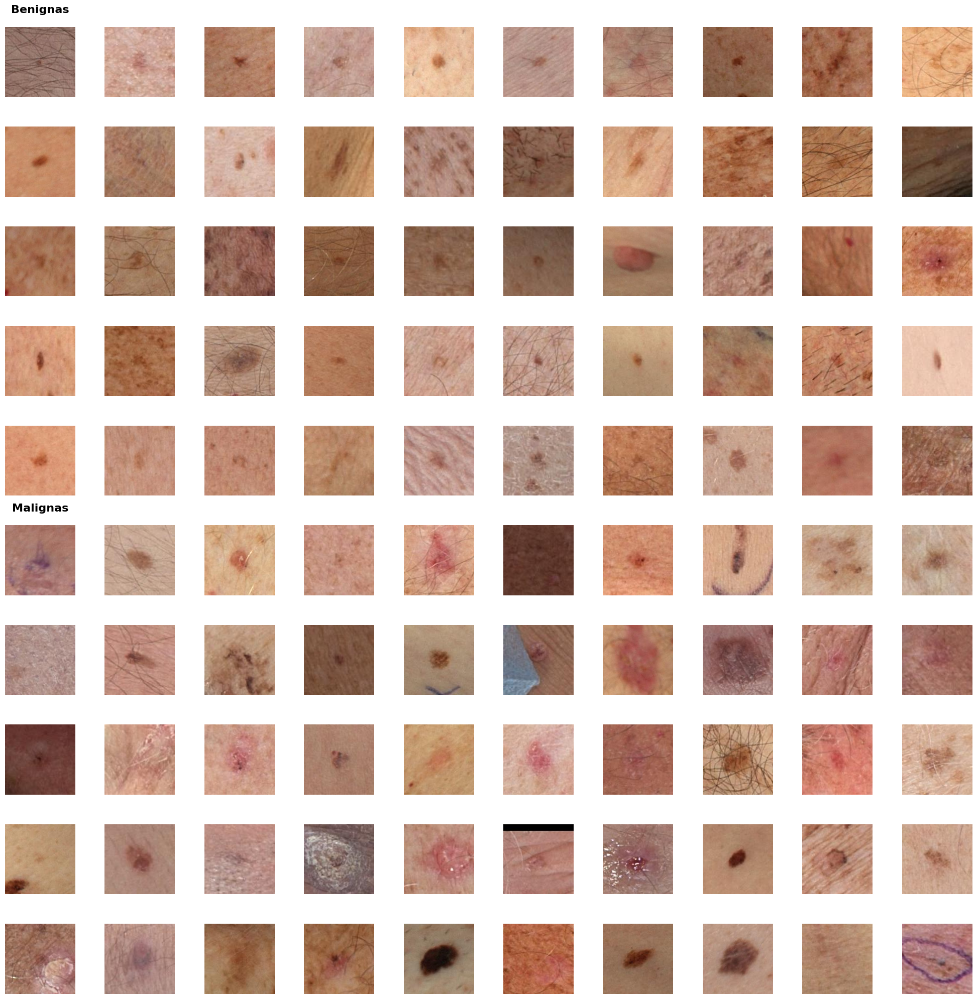

In [ ]:
# Filtramos el df para obtener 50 imágenes benignas y 50 malignas
df_target_0 = train_df[train_df['target'] == 'benigno'].head(50)  #  benignas
df_target_1 = train_df[train_df['target'] == 'maligno'].head(50)  #  malignas

# Crear una figura (10 filas y 10 columnas)
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
axes = axes.flatten()

# imágenes benignas
for idx, path in enumerate(df_target_0['path_image']):
    img = mpimg.imread(path)
    axes[idx].imshow(img)
    axes[idx].axis('off')
# Título para benignas
axes[0].set_title('Benignas', fontsize=16, fontweight='bold', loc='center', pad=20)

# imágenes malignas
for idx, path in enumerate(df_target_1['path_image']):
    img = mpimg.imread(path)
    axes[50 + idx].imshow(img)
    axes[50 + idx].axis('off')
# Título para malignas
axes[50].set_title('Malignas', fontsize=16, fontweight='bold', loc='center', pad=20)
plt.tight_layout()
plt.show()


Comprobamos el tamaño de las imágenes

In [ ]:
# generanos columna image_size con el tamaño de cada imagen
train_df['image_size'] = train_df['path_image'].apply(lambda path: Image.open(path).size)
print(train_df[['path_image', 'image_size']].head())


                                          path_image  image_size
0  /content/drive/Shareddrives/MVP_SC/datos/image...  (145, 145)
1  /content/drive/Shareddrives/MVP_SC/datos/image...  (117, 117)
2  /content/drive/Shareddrives/MVP_SC/datos/image...  (157, 157)
3  /content/drive/Shareddrives/MVP_SC/datos/image...  (113, 113)
4  /content/drive/Shareddrives/MVP_SC/datos/image...  (163, 163)


Tienen un tamaño variable. Hay que redimensionarlas.

## Data augmentation

In [ ]:
# para train realizamos las transformaciones en las imaganes de rotación, flip zoom...
train_datagen = ImageDataGenerator(
    #rescale=1./255,
    dtype='float32',
    preprocessing_function=preprocess_input, # incluye normalizacion eppecífica para modelos resnet
    rotation_range=30, # rotamos 30 grados las imagenes
    width_shift_range=0.1,
    height_shift_range=0.1,
    fill_mode='nearest',
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True)

# para val y test aplicamos la normalizacion
val_datagen = ImageDataGenerator(dtype='float32',
                                 preprocessing_function=preprocess_input
                                 #rescale=1./255
                                 )

test_datagen = ImageDataGenerator(dtype='float32',
                                  preprocessing_function=preprocess_input
                                  #rescale=1./255,
                                  )

# Definir los batch size
batch_size = 32

# definir el tamaño final de las imágenes
img_width, img_height = 224, 224 # redimensionamos todas a 224 x 224 para ajustar la entrada a la ResNet50
normed_dims = (img_height, img_width)

# Crear generadores
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="path_image",
    y_col="target",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=True,
    class_mode='categorical')

validation_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="path_image",
    y_col="target",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="path_image",
    y_col="target",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical')

# Verificar las clases
train_generator.class_indices


Found 1400 validated image filenames belonging to 2 classes.
Found 300 validated image filenames belonging to 2 classes.
Found 300 validated image filenames belonging to 2 classes.


{'benigno': 0, 'maligno': 1}

Comprobamos que preprocess_input se ha aplicado


https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet/preprocess_input

In [ ]:
# Obtener un lote de imágenes del generador de entrenamiento
batch = next(train_generator)

# batch[0] contiene las imágenes, batch[1] contiene las etiquetas
imagenes_procesadas = batch[0]

# Verificar el rango de valores de las imágenes procesadas
print("Valor mínimo:", imagenes_procesadas.min())
print("Valor máximo:", imagenes_procesadas.max())


Valor mínimo: -110.68
Valor máximo: 131.32


Vamos a verificar las transformaciones que se realizan en train cogiendo una imagen de ejemplo

In [ ]:
# Obtener la ruta de la imagen desde el DataFrame
ruta_imagen = train_df.iloc[4]['path_image']

# Cargar la imagen
imagen = load_img(ruta_imagen)

# Imprimir el tamaño de la imagen
print(imagen.size)

(163, 163)


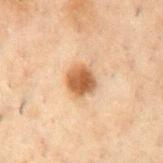

In [ ]:
imagen

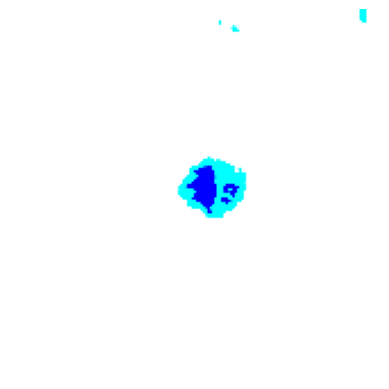

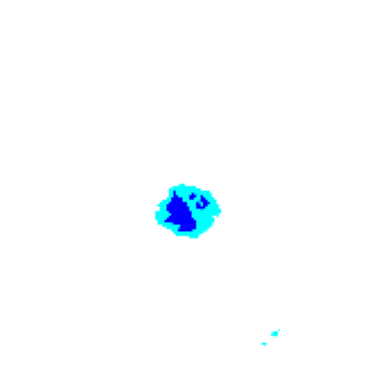

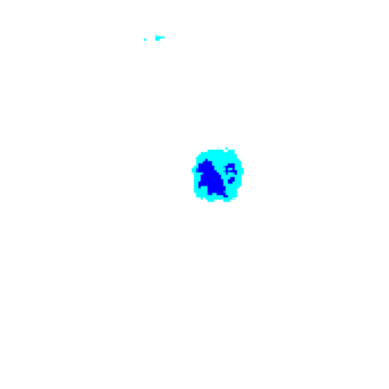

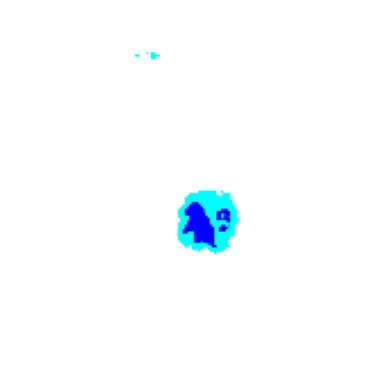

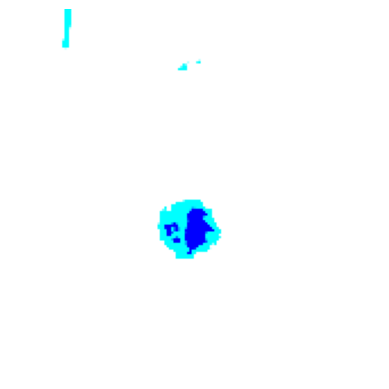

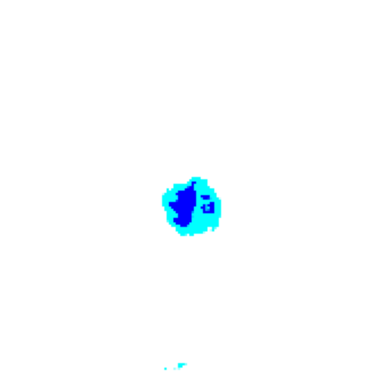

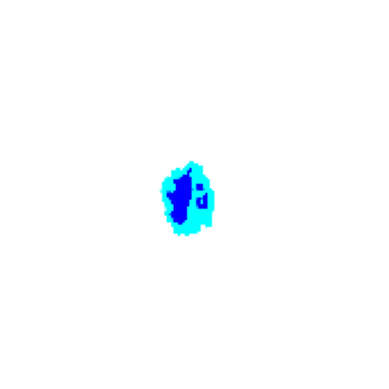

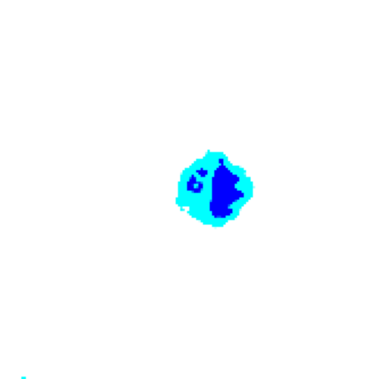

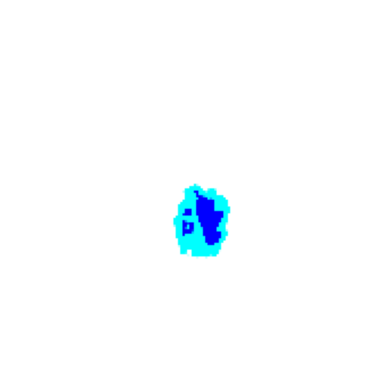

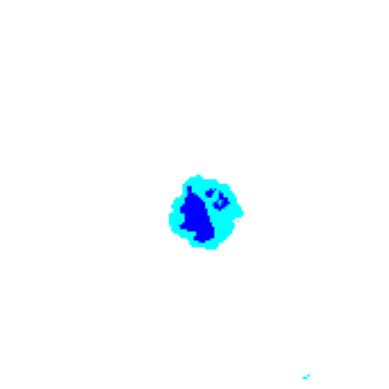

In [ ]:
imagen_num = np.array([img_to_array(imagen)])
for _ in range(10):
    plt.imshow(train_datagen.flow(imagen_num)[0][0])
    plt.axis("off")
    plt.show()

al usar el preprocesado para resnet de keras:
las imágenes no tienen los valores entre 0 y 1 y por eso se visualizan así las imágenes

## Definición de modelo de clasificación con base ResNet50

In [ ]:
# Cargar el modelo base ResNet50
base_model = ResNet50(input_shape=normed_dims+(3,), include_top=False, weights='imagenet')

# Congelar las capas del modelo base
for layer in base_model.layers:
    layer.trainable = False

# Para las pruebas de descongelar las capas del modelo base
#for layer in base_model.layers[-20:]: indicar numero de capas que se quieren descongelar
#    layer.trainable = True

# capas adicionales que añadimos:

flatten = False # True: aplano con Flatten. False: aplano con GlobalAveragePooling2D
aux1 = base_model.output
aux2 = GlobalAveragePooling2D()(aux1)
aux3 = Dense(32, activation='relu',
             kernel_regularizer=regularizers.l2(0.05))(aux2)
aux4 = Dense(16, activation='relu',
             kernel_regularizer=regularizers.l2(0.05))(aux3)
aux5 = Dense(2, activation="softmax")(aux4) # salida para clasificación

# Crear el modelo y compilar
model = Model(inputs=base_model.input, outputs=aux5)

model.compile(optimizers.Adam(learning_rate=0.0001), # optimizer='rmsprop',
              #loss='binary_crossentropy',
              loss='categorical_crossentropy',
              metrics=["accuracy"])

model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,653,842 (90.23 MB)

 Trainable params: 66,130 (258.32 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

## entrenamiento

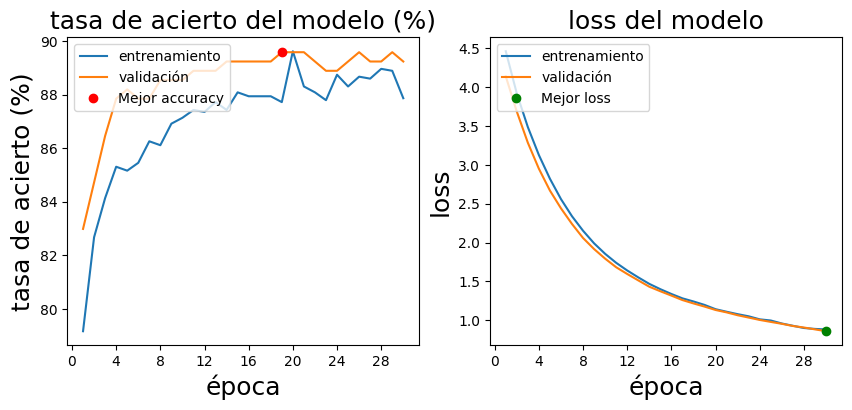

In [ ]:
# configuración de callback
date_str = datetime.now().strftime("%Y%m%d_%H%M%S")
modelpath = modelos_image_path + f"best_resnet50_model_{date_str}.keras"
checkpoint = ModelCheckpoint(modelpath, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min')

# inicializar listas para guardar las métricas
serie_tr_acc = []
serie_val_acc = []
serie_tr_loss = []
serie_val_loss = []

# definimos las épocas
epochs = 30

# número de muestras
number_train_samples = train_generator.n
number_val_samples = validation_generator.n

# Entrenamiento
for e in range(epochs):
    salida = model.fit(train_generator,
                       steps_per_epoch=number_train_samples // batch_size,
                       epochs=1,
                       callbacks=[checkpoint],
                       verbose=1,
                       shuffle=True,
                       validation_data=validation_generator,
                       validation_steps=number_val_samples // batch_size)

    # Guardar métricas
    serie_tr_acc.append(salida.history["accuracy"][0])
    serie_val_acc.append(salida.history["val_accuracy"][0])
    serie_tr_loss.append(salida.history["loss"][0])
    serie_val_loss.append(salida.history["val_loss"][0])

    # Limpiar la salida y mostrar las gráficas
    clear_output(wait=True)
    grafica_entrenamiento(serie_tr_acc, serie_val_acc,
                          serie_tr_loss, serie_val_loss)


## Resultados. Evaluación

In [ ]:
model = tf.keras.models.load_model(modelos_image_path + 'best_resnet50_model_20240919_170445.keras')

In [ ]:
scores_val = model.evaluate(validation_generator)
print('Val loss    :', scores_val[0])
print('Val accuracy:', scores_val[1])
print()

scores_te = model.evaluate(test_generator)
print('Test loss     :', scores_te[0])
print('Test accuracy :', scores_te[1])

10/10 ━━━━━━━━━━━━━━━━━━━━ 68s 6s/step - accuracy: 0.9043 - loss: 0.8360
Val loss    : 0.8647496700286865
Val accuracy: 0.8933333158493042

10/10 ━━━━━━━━━━━━━━━━━━━━ 57s 6s/step - accuracy: 0.8838 - loss: 0.8239
Test loss     : 0.8449156284332275
Test accuracy : 0.8799999952316284


In [ ]:
# Realizar predicciones en el conjunto de test
predictions_prob = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1)

10/10 ━━━━━━━━━━━━━━━━━━━━ 70s 7s/step


In [ ]:
# Convertir probabilidades a etiquetas de clase
predictions = np.argmax(predictions_prob, axis=1)

# Obtener las etiquetas verdaderas
true_labels = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

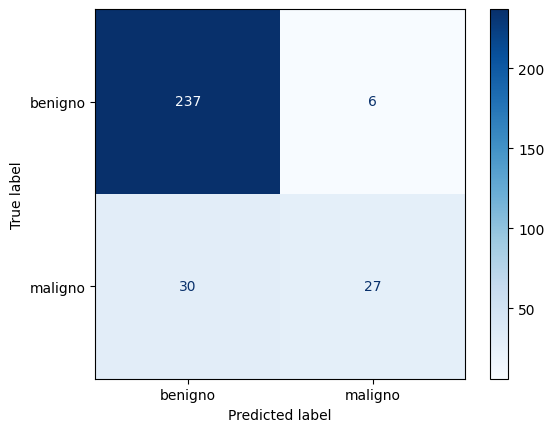

In [ ]:
# Calculamps la cm
cm = confusion_matrix(true_labels, predictions, labels=np.arange(len(class_labels)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues)
plt.show()


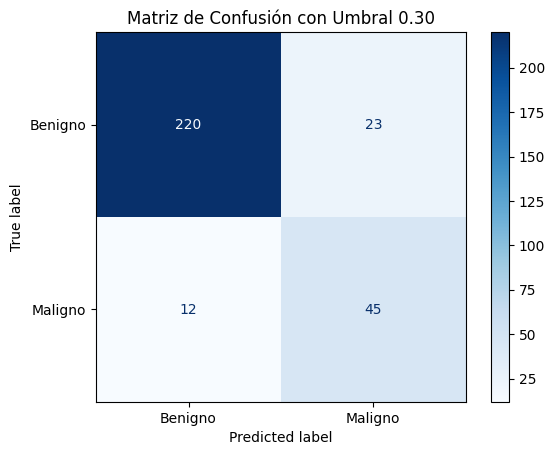

Mejor umbral: 0.30
Precisión de benignos: 0.91
Detección de malignos: 0.79


In [ ]:
# usamos la función para calcular el umbral óptimo
umbral_optimo = optimizar_umbral(predictions_prob=predictions_prob,
                                 true_labels=test_generator.classes,
                                 benigno_min_precision=0.9)

In [ ]:
# calculamos para guaradar predicciones para el mejor umbral
umbral = 0.3
predictions = (predictions_prob[:, 1] > umbral).astype(int)

Probamos a descongelar las ultimas 20 capas y entrenar 5 epocas para ver si el modelo mejora. Es mejor pocas épocas porque sobreajusta muy rápido.

In [ ]:
# Descongelar las últimas capas del modelo base
for layer in base_model.layers[-20:]:
    layer.trainable = True

model.compile(optimizer=optimizers.Adam(learning_rate=0.00001),
              loss='categorical_crossentropy',
              metrics=["accuracy"])

# Entrenamiento
history_fine = model.fit(train_generator,
                        epochs=5,
                        validation_data=validation_generator)


Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


44/44 ━━━━━━━━━━━━━━━━━━━━ 564s 11s/step - accuracy: 0.8967 - loss: 0.8550 - val_accuracy: 0.8967 - val_loss: 0.8614
Epoch 2/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 376s 8s/step - accuracy: 0.8974 - loss: 0.8394 - val_accuracy: 0.8967 - val_loss: 0.8597
Epoch 3/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 346s 8s/step - accuracy: 0.8907 - loss: 0.8388 - val_accuracy: 0.8967 - val_loss: 0.8584
Epoch 4/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 380s 8s/step - accuracy: 0.8970 - loss: 0.8376 - val_accuracy: 0.8967 - val_loss: 0.8552
Epoch 5/5
44/44 ━━━━━━━━━━━━━━━━━━━━ 419s 9s/step - accuracy: 0.8981 - loss: 0.8309 - val_accuracy: 0.8967 - val_loss: 0.8524


La loss de ambos sigue bajando, aunque de manera más lenta en val. La accuracy se mantiene. Vamos a evaluar si mejora la clasificación

In [ ]:
model.save(modelos_image_path + 'modelo_descongelando_capas_ResNet50.keras')

In [ ]:
scores_tr = model.evaluate(train_generator)
print("ESTADÍSTICAS EN TRAINING CON DATA AUGMENTATION:")
print('Train loss    :', scores_tr[0])
print('Train accuracy:', scores_tr[1])
print()

44/44 ━━━━━━━━━━━━━━━━━━━━ 366s 8s/step - accuracy: 0.9083 - loss: 0.8277
ESTADÍSTICAS EN TRAINING CON DATA AUGMENTATION:
Train loss    : 0.834839403629303
Train accuracy: 0.8942857384681702



In [ ]:
scores_val = model.evaluate(validation_generator)
print('Val loss    :', scores_val[0])
print('Val accuracy:', scores_val[1])
print()

scores_te = model.evaluate(test_generator)
print('Test loss     :', scores_te[0])
print('Test accuracy :', scores_te[1])

10/10 ━━━━━━━━━━━━━━━━━━━━ 60s 6s/step - accuracy: 0.9076 - loss: 0.8179
Val loss    : 0.8523814082145691
Val accuracy: 0.8966666460037231

10/10 ━━━━━━━━━━━━━━━━━━━━ 58s 6s/step - accuracy: 0.8743 - loss: 0.8133
Test loss     : 0.8356236815452576
Test accuracy : 0.8666666746139526


aunque val mejora sutilmente, el grupo test empeora ligeramente.

In [ ]:
# Realizar predicciones en el conjunto de test
predictions_prob = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1)

10/10 ━━━━━━━━━━━━━━━━━━━━ 66s 6s/step


In [ ]:
# Convertir probabilidades a etiquetas de clase
predictions = np.argmax(predictions_prob, axis=1)

# Obtener las etiquetas verdaderas
true_labels = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

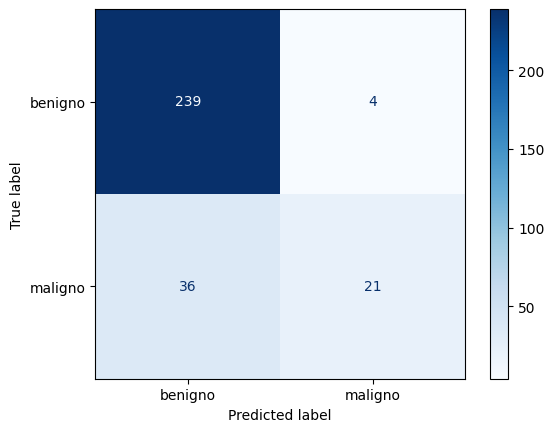

In [ ]:
# Calcular la matriz de confusión
cm = confusion_matrix(true_labels, predictions, labels=np.arange(len(class_labels)))

# Crear una visualización de la matriz de confusión
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)

# Mostrar la matriz de confusión
disp.plot(cmap=plt.cm.Blues)
plt.show()


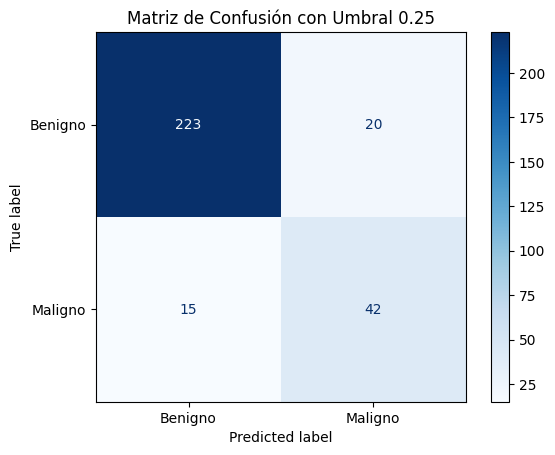

Mejor umbral: 0.25
Precisión de benignos: 0.92
Detección de malignos: 0.74


In [ ]:
# Llamar a la función con las probabilidades predichas y las etiquetas reales
umbral_optimo = optimizar_umbral(predictions_prob=predictions_prob,
                                 true_labels=test_generator.classes,
                                 benigno_min_precision=0.9)


## Explicabilidad

Vamos a visualizar los casos que han sido peor clasificados

In [ ]:
# cargamos el modelo
model = tf.keras.models.load_model(modelos_image_path + 'best_resnet50_model_20240919_170445.keras')

In [ ]:
predictions_prob = model.predict(test_generator, steps=test_generator.samples // test_generator.batch_size + 1)

# calculamos para el umbral optimizado
umbral = 0.3
predictions = (predictions_prob[:, 1] > umbral).astype(int)

# Obtener las etiquetas verdaderas
true_labels = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

Añadimos los resultados al test_df: las predicciones y la etiquetas reales para poder después visualizar las imágenes de falsos positivos y falsos negativos

In [ ]:
test_df['predictions'] = predictions  # Añadir las predicciones
test_df['true_labels'] = true_labels


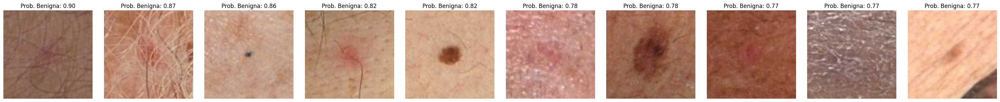

In [ ]:
false_negatives_df = test_df[(test_df['true_labels'] == 1) & (test_df['predictions'] == 0)]

# Filtrar los falsos negativos (predicciones benignas siendo en realidad malignas)
false_negatives_df = test_df[(test_df['true_labels'] == 1) & (test_df['predictions'] == 0)].copy()

# crear la columna con la probabilidad predicha para los falsos negativos
false_negatives_df['prob_benigno'] = predictions_prob[false_negatives_df.index, 0]

# Ordenar los falsos negativos por la probabilidad de haber sido clasificados como benignos (de mayor a menor)
false_negatives_df = false_negatives_df.sort_values(by='prob_benigno', ascending=False)

# escoger lss 10 imágenes con mayor probabilidad
num_images_to_show = min(10, len(false_negatives_df))

# visualización
if num_images_to_show > 0:
    plt.figure(figsize=(num_images_to_show * 3, 3))

    for i in range(num_images_to_show):
        img_path = false_negatives_df.iloc[i]['path_image']
        img = cv2.imread(img_path)  # Cargar la imagen usando OpenCV
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # convertir la imagen a RGB para matplotlib
        prob_benigno = false_negatives_df.iloc[i]['prob_benigno']  # Obtener la probabilidad de ser benigna

        plt.subplot(1, num_images_to_show, i+1)
        plt.imshow(img)
        plt.title(f"Prob. Benigna: {prob_benigno:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No hay imágenes mal clasificadas como benignas siendo malignas.")


In [ ]:
false_negatives_df

,isic_id,target,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_A,tbp_lv_Aext,tbp_lv_B,...,tbp_lv_radial_color_std_max,tbp_lv_stdL,tbp_lv_stdLExt,tbp_lv_symm_2axis,tbp_lv_symm_2axis_angle,tbp_lv_dnn_lesion_confidence,path_image,predictions,true_labels,prob_benigno
251,ISIC_3646371,maligno,IP_7470499,50.0,male,upper extremity,1.65,20.007400,17.386720,20.729280,...,0.000000,0.905649,2.045347,0.380952,110,80.907290,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.896375
298,ISIC_8195275,maligno,IP_8672132,70.0,male,anterior torso,3.40,26.547840,18.754030,31.145790,...,2.054238,2.234116,2.913262,0.495192,110,99.902160,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.874697
165,ISIC_6798815,maligno,IP_2456971,60.0,male,anterior torso,1.45,12.673908,13.683175,19.948149,...,0.000000,6.823434,2.041922,0.346939,165,99.994087,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.858433
123,ISIC_9726753,maligno,IP_2870467,45.0,male,posterior torso,3.97,26.622150,17.907114,30.467007,...,1.328435,1.647755,2.437316,0.278261,145,99.999261,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.816984
122,ISIC_3288933,maligno,IP_5471913,25.0,female,lower extremity,4.38,23.199550,13.288220,33.881120,...,1.804679,9.463246,2.195090,0.138587,160,100.000000,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.816543
209,ISIC_4750368,maligno,IP_2456971,60.0,male,head/neck,4.54,30.419728,22.811207,24.904009,...,0.519966,1.280868,3.039721,0.333333,140,89.543188,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.783207
43,ISIC_6166598,maligno,IP_6774617,70.0,male,lower extremity,9.56,18.973700,15.646850,21.779640,...,1.917765,3.946184,1.924675,0.165251,10,99.999460,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.775214
69,ISIC_7770173,maligno,IP_5230038,65.0,male,posterior torso,2.74,31.945128,26.440085,26.384615,...,0.352750,0.809341,1.494735,0.426573,160,96.356547,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.773133
285,ISIC_6465391,maligno,IP_7272992,70.0,male,lower extremity,1.70,14.495540,12.138300,16.770800,...,0.000000,0.829337,3.699727,0.418605,125,0.012213,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.772071
166,ISIC_2235682,maligno,IP_2491677,70.0,male,posterior torso,3.60,20.618823,15.598929,30.100576,...,0.901078,2.561640,2.163253,0.248588,100,99.999666,/content/drive/Shareddrives/MVP_SC/datos/image...,0,1,0.771622


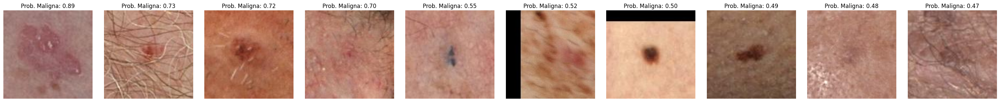

In [ ]:
# Filtrar los falsos positivos (predicciones malignas siendo en realidad benignas)
false_positives_df = test_df[(test_df['true_labels'] == 0) & (predictions == 1)].copy()
false_positives_df['prob_maligno'] = predictions_prob[false_positives_df.index, 1]

# Ordenar los falsos positivos por la probabilidad de haber sido clasificados como malignos (de mayor a menor)
false_positives_df = false_positives_df.sort_values(by='prob_maligno', ascending=False)

# seleccion de  10 imágenes con mayor probabilidad
num_images_to_show = min(10, len(false_positives_df))

# visualizacion
if num_images_to_show > 0:
    plt.figure(figsize=(num_images_to_show * 3, 3))

    for i in range(num_images_to_show):
        img_path = false_positives_df.iloc[i]['path_image']
        img = cv2.imread(img_path)  # cargar la imagen
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # convertir la imagen a RGB para matplotlib
        prob_maligno = false_positives_df.iloc[i]['prob_maligno']  # Obtener la probabilidad de ser maligna

        plt.subplot(1, num_images_to_show, i+1)
        plt.imshow(img)
        plt.title(f"Prob. Maligna: {prob_maligno:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No hay imágenes mal clasificadas como malignas siendo benignas.")

In [ ]:
false_positives_df

,isic_id,target,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_A,tbp_lv_Aext,tbp_lv_B,...,tbp_lv_radial_color_std_max,tbp_lv_stdL,tbp_lv_stdLExt,tbp_lv_symm_2axis,tbp_lv_symm_2axis_angle,tbp_lv_dnn_lesion_confidence,path_image,predictions,true_labels,prob_maligno
269,ISIC_9749120,benigno,IP_1645936,65.0,female,lower extremity,12.35,23.189561,15.879385,16.947603,...,1.817960,1.911150,1.995679,0.311419,130,79.882962,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.892394
46,ISIC_9868564,benigno,IP_7867932,45.0,male,anterior torso,4.25,22.226050,14.363030,24.949130,...,1.911122,2.856387,2.934692,0.516340,25,99.972770,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.733103
268,ISIC_4058201,benigno,IP_1959951,60.0,male,head/neck,5.87,22.945033,18.971644,24.192035,...,2.102097,3.015110,3.103734,0.269159,50,99.976999,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.720980
212,ISIC_4451159,benigno,IP_5714646,40.0,male,head/neck,1.16,23.917870,18.212670,18.869640,...,0.000000,1.328596,1.691190,0.307692,60,99.483070,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.697229
61,ISIC_7789083,benigno,IP_2456971,60.0,male,anterior torso,4.07,13.842400,17.742493,17.513215,...,3.492988,5.581217,2.686189,0.229682,90,82.173878,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.552032
23,ISIC_6530831,benigno,IP_3921915,50.0,male,posterior torso,3.72,19.909852,15.389878,27.404432,...,0.909245,2.213112,2.784431,0.413265,30,99.706334,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.524758
286,ISIC_0501106,benigno,IP_8979449,40.0,female,anterior torso,4.22,19.913830,12.844410,27.891320,...,2.534330,10.636350,2.182700,0.160410,55,100.000000,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.497881
6,ISIC_0627695,benigno,IP_8979449,40.0,female,lower extremity,4.32,16.401960,10.867880,19.980390,...,1.075797,4.608193,2.169918,0.230563,150,99.999990,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.494695
223,ISIC_8247359,benigno,IP_1438784,50.0,male,head/neck,3.23,20.486423,18.861149,23.575623,...,0.194274,1.364270,3.172091,0.414474,120,99.666971,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.484369
241,ISIC_8839917,benigno,IP_0431324,70.0,male,upper extremity,4.83,18.314306,16.735320,20.847595,...,1.379475,2.415238,3.729057,0.326761,170,88.072038,/content/drive/Shareddrives/MVP_SC/datos/image...,1,0,0.466389


# Modelo combinado Imagenes + Datos

## Definir modelo combinado

In [ ]:
# definir el tamaño final de las imágenes
img_width, img_height = 224, 224 # redimensionamos todas a 224 x 224 para ajustar la entrada a la ResNet50
normed_dims = (img_height, img_width)

# Cargar el modelo base ResNet50 sin la parte superior
base_model = ResNet50(input_shape=normed_dims+(3,), include_top=False, weights='imagenet')

# Congelar las capas del modelo base
for layer in base_model.layers:
    layer.trainable = False

# capas adicionales:
flatten = False # True: aplano con Flatten. False: aplano con GlobalAveragePooling2D
aux1 = base_model.output
if flatten:
    aux2 = Flatten()(aux1)
else:
    aux2 = GlobalAveragePooling2D()(aux1)
aux3 = Dense(48, activation='relu',
             kernel_regularizer=regularizers.l2(0.002))(aux2)
aux4 = Dense(16, activation='relu',
             kernel_regularizer=regularizers.l2(0.004))(aux3)

# Crear la entrada y las capas densas para las variables tabulares
input_other = Input(shape=(X_train_scaled.shape[1],), name='input_other')
dense1 = Dense(16, activation='relu')(input_other)
dense1 = Dropout(0.4)(dense1)
#dense2 = Dense(32, activation='relu')(dense1)

# Concatenar las salidas de las dos ramas
concatenated = Concatenate()([aux4, dense1])

# Capas adicionales para combinar ambas entradas
combined_dense1 = Dense(16, activation='relu')(concatenated)
combined_dense1 = Dropout(0.3)(combined_dense1)

#combined_dense2 = Dense(32, activation='relu')(combined_dense1)

# salida
output = Dense(2, activation='softmax')(combined_dense1)

# Crear el modelo multi input o combinado
model = Model(inputs=[base_model.input, input_other], outputs=output)

model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,688,082 (90.36 MB)

 Trainable params: 100,370 (392.07 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

## Combinar datos de entrada

previamente los datos tabulares tienen que haber sido cargados:
ejecucion del modulo OnehotEncoder para las varaibles categoricas del modelo sin ctgan


In [ ]:
y_train = train_df[['target']]
y_val = val_df[['target']]
y_test = test_df[['target']]

In [ ]:
mapping = {0: 'benigno', 1: 'maligno'}
# Using .loc to avoid SettingWithCopyWarning
y_train.loc[:, 'target'] = y_train['target'].map(mapping)
y_val.loc[:, 'target'] = y_val['target'].map(mapping)
y_test.loc[:, 'target'] = y_test['target'].map(mapping)


In [ ]:
# Data generators para entrenamiento, validación y prueba
train_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function=preprocess_input,
    rotation_range=30,
    width_shift_range=0.1,
    height_shift_range=0.1,
    fill_mode='nearest',
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True)

val_datagen = ImageDataGenerator(dtype='float32', preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(dtype='float32', preprocessing_function=preprocess_input)


# Definir los batch size
batch_size = 32

# Crear generadores
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="path_image",
    y_col="target",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=True,
    class_mode='categorical')

validation_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="path_image",
    y_col="target",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="path_image",
    y_col="target",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    class_mode='categorical')


# Verificar las clases
train_generator.class_indices


Found 1400 validated image filenames belonging to 2 classes.
Found 300 validated image filenames belonging to 2 classes.
Found 300 validated image filenames belonging to 2 classes.


{'benigno': 0, 'maligno': 1}

In [ ]:
# Probar un batch del generador de entrenamiento
(img_batch, other_batch), y_batch = next(combined_generator(train_generator, X_train_scaled, y_train))
print(f"Imágenes: {img_batch.shape}")
print(f"Datos adicionales: {other_batch.shape}")
print(f"Etiquetas: {y_batch.shape}")


Imágenes: (32, 224, 224, 3)
Datos adicionales: (32, 41)
Etiquetas: (32, 2)


Usamos la función generator_dataset para combinar los datos de ambas ramas (imagenes y tabulares) en el formato adecuado para entrenar el modelo combinado

In [ ]:
# Crear los datasets para entrenamiento y validación
train_dataset = generator_dataset(train_generator, X_train_scaled, y_train, batch_size)
val_dataset = generator_dataset(validation_generator, X_val_scaled, y_val, batch_size)

Comprobamos que tienen el tamaño correcto las entradas

In [ ]:
# Obtener un batch del dataset de entrenamiento
for images, labels in train_dataset.take(1):  # 'take(1)' toma un solo batch
    image_batch, other_batch = images
    print("Forma de image_batch:", image_batch.shape)
    print("Forma de other_batch:", other_batch.shape)
    print("Forma de labels:", labels.shape)

# Obtener un batch del dataset de validación
for images, labels in val_dataset.take(1):  # 'take(1)' toma un solo batch
    image_batch, other_batch = images
    print("Forma de image_batch:", image_batch.shape)
    print("Forma de other_batch:", other_batch.shape)
    print("Forma de labels:", labels.shape)


Forma de image_batch: (32, 224, 224, 3)
Forma de other_batch: (32, 41)
Forma de labels: (32, 2)
Forma de image_batch: (32, 224, 224, 3)
Forma de other_batch: (32, 41)
Forma de labels: (32, 2)


## entrenar modelo combinado

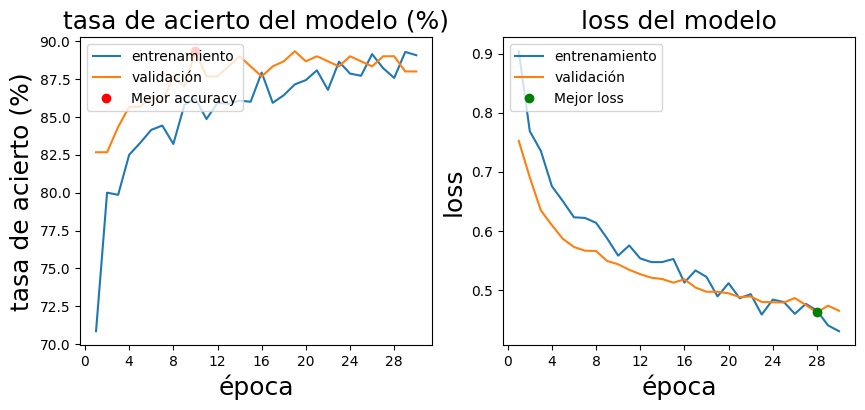

In [ ]:
# callback para guardar el mejor modelo
date_str = datetime.now().strftime("%Y%m%d_%H%M%S")
modelpath = modelos_image_path + f"best_combined_model{date_str}_.keras"
checkpoint = ModelCheckpoint(modelpath, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min')

# Inicializar listas para guardar métricas
serie_tr_acc = []
serie_val_acc = []
serie_tr_loss = []
serie_val_loss = []

# épocas
epochs = 30

# Obtener el número de muestras
number_train_samples = train_generator.n
number_val_samples = validation_generator.n

# Entrenamiento
for e in range(epochs):
    salida = model.fit(train_dataset,
                        steps_per_epoch=len(train_generator),
                        epochs=1,
                        validation_data=val_dataset,
                        validation_steps=len(validation_generator),
                        callbacks=[checkpoint],
                        verbose=1)

    # Guardar métricas
    serie_tr_acc.append(salida.history["accuracy"][0])
    serie_val_acc.append(salida.history["val_accuracy"][0])
    serie_tr_loss.append(salida.history["loss"][0])
    serie_val_loss.append(salida.history["val_loss"][0])

    # Limpiar la salida y mostrar las gráficas
    clear_output(wait=True)
    grafica_entrenamiento(serie_tr_acc, serie_val_acc,
                          serie_tr_loss, serie_val_loss)



## evaluación modelo combinado

In [ ]:
model = tf.keras.models.load_model(modelos_image_path + 'best_combined_model20240920_094128_.keras')

In [ ]:
# evaluamos el conjunto de test
test_dataset = generator_dataset(test_generator, X_test_scaled, y_test, batch_size)


10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 142ms/step


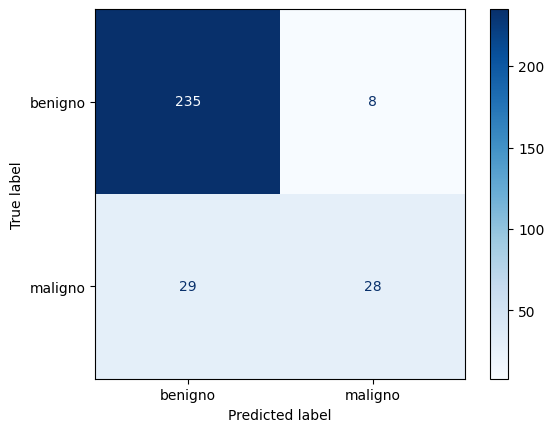

In [ ]:
# Realizar predicciones en el conjunto de test
predictions_prob = model.predict(test_dataset, steps=test_generator.samples // test_generator.batch_size + 1)

# Convertir probabilidades a etiquetas de clase
predictions = np.argmax(predictions_prob, axis=1)

# Obtener las etiquetas verdaderas
true_labels = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# calculo de cm
cm = confusion_matrix(true_labels, predictions, labels=np.arange(len(class_labels)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues)
plt.show()


In [ ]:
# accuracy del modelo con test
accuracy_metric = Accuracy()
accuracy_metric.update_state(true_labels, predictions)
accuracy = accuracy_metric.result().numpy()

print('Test accuracy :', accuracy)

Test accuracy : 0.87666667


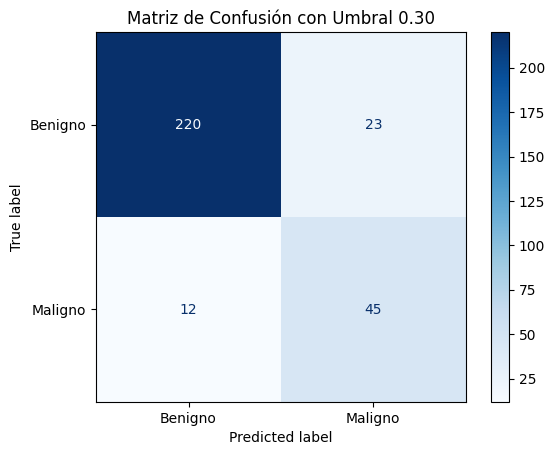

Mejor umbral: 0.30
Precisión de benignos: 0.91
Detección de malignos: 0.79


In [ ]:
# calcular umbral optimizado
umbral_optimo = optimizar_umbral(predictions_prob=predictions_prob,
                                 true_labels=true_labels,
                                 benigno_min_precision=0.9)


## explicabilidad

In [ ]:
# umbral optimizado
umbral = 0.3

# Recalcular las predicciones usando el umbral de 0.3
predictions = (predictions_prob[:, 1] > umbral).astype(int)
true_labels = test_generator.classes
#class_labels = list(test_generator.class_indices.keys())


In [ ]:
test_df['predictions'] = predictions  # Añadir las predicciones
test_df['true_labels'] = true_labels


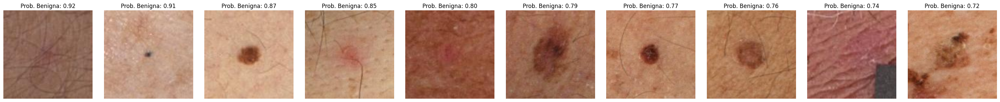

In [ ]:
false_negatives_df = test_df[(test_df['true_labels'] == 1) & (test_df['predictions'] == 0)]

# Filtrar los falsos negativos (predicciones benignas siendo en realidad malignas)
false_negatives_df = test_df[(test_df['true_labels'] == 1) & (test_df['predictions'] == 0)].copy()

# crear la columna con la probabilidad predicha para los falsos negativos
false_negatives_df['prob_benigno'] = predictions_prob[false_negatives_df.index, 0]

# Ordenar los falsos negativos por la probabilidad de haber sido clasificados como benignos (de mayor a menor)
false_negatives_df = false_negatives_df.sort_values(by='prob_benigno', ascending=False)

# escoger lss 10 imágenes con mayor probabilidad
num_images_to_show = min(10, len(false_negatives_df))

# visualización
if num_images_to_show > 0:
    plt.figure(figsize=(num_images_to_show * 3, 3))

    for i in range(num_images_to_show):
        img_path = false_negatives_df.iloc[i]['path_image']
        img = cv2.imread(img_path)  # Cargar la imagen usando OpenCV
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # convertir la imagen a RGB para matplotlib
        prob_benigno = false_negatives_df.iloc[i]['prob_benigno']  # Obtener la probabilidad de ser benigna

        plt.subplot(1, num_images_to_show, i+1)
        plt.imshow(img)
        plt.title(f"Prob. Benigna: {prob_benigno:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No hay imágenes mal clasificadas como benignas siendo malignas.")


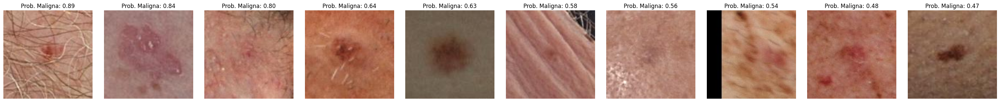

In [ ]:
# Filtrar los falsos positivos (predicciones malignas siendo en realidad benignas)
false_positives_df = test_df[(test_df['true_labels'] == 0) & (predictions == 1)].copy()
false_positives_df['prob_maligno'] = predictions_prob[false_positives_df.index, 1]

# Ordenar los falsos positivos por la probabilidad de haber sido clasificados como malignos (de mayor a menor)
false_positives_df = false_positives_df.sort_values(by='prob_maligno', ascending=False)

# seleccion de  10 imágenes con mayor probabilidad
num_images_to_show = min(10, len(false_positives_df))

# visualizacion
if num_images_to_show > 0:
    plt.figure(figsize=(num_images_to_show * 3, 3))

    for i in range(num_images_to_show):
        img_path = false_positives_df.iloc[i]['path_image']
        img = cv2.imread(img_path)  # cargar la imagen
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # convertir la imagen a RGB para matplotlib
        prob_maligno = false_positives_df.iloc[i]['prob_maligno']  # Obtener la probabilidad de ser maligna

        plt.subplot(1, num_images_to_show, i+1)
        plt.imshow(img)
        plt.title(f"Prob. Maligna: {prob_maligno:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No hay imágenes mal clasificadas como malignas siendo benignas.")